In [4]:
import os
import warnings

import cv2
import numpy as np
from gym import spaces
import matplotlib.pyplot as plt

from stable_baselines.common.base_class import BaseRLModel
from stable_baselines.common.vec_env import VecEnv, VecFrameStack
from stable_baselines.common.base_class import _UnvecWrapper

In [34]:
ac = ['ACTION_NIL',
 'ACTION_USE',
 'ACTION_LEFT',
 'ACTION_RIGHT',
 'ACTION_DOWN',
 'ACTION_UP']

In [105]:
def generate_expert_traj(save_path=None, n_timesteps=0,
                         n_episodes=1, image_folder='recorded_images'):
    """
    Train expert controller (if needed) and record expert trajectories.

    .. note::

        only Box and Discrete spaces are supported for now.

    :param model: (RL model or callable) The expert model, if it needs to be trained,
        then you need to pass ``n_timesteps > 0``.
    :param save_path: (str) Path without the extension where the expert dataset will be saved
        (ex: 'expert_cartpole' -> creates 'expert_cartpole.npz').
        If not specified, it will not save, and just return the generated expert trajectories.
        This parameter must be specified for image-based environments.
    :param env: (gym.Env) The environment, if not defined then it tries to use the model
        environment.
    :param n_timesteps: (int) Number of training timesteps
    :param n_episodes: (int) Number of trajectories (episodes) to record
    :param image_folder: (str) When using images, folder that will be used to record images.
    :return: (dict) the generated expert trajectories.
    """

    rang = list(range(1,n_episodes+1))
    print(rang)
    # Check if we need to record images
    record_images = True
    if record_images and save_path is None:
        warnings.warn("Observations are images but no save path was specified, so will save in numpy archive; "
                      "this can lead to higher memory usage.")
        record_images = False


    image_ext = 'jpg'
    if record_images:
        # We save images as jpg or png, that have only 3/4 color channels
        folder_path = os.path.dirname(save_path)
        image_folder = os.path.join(folder_path, image_folder)
        os.makedirs(image_folder, exist_ok=True)
        print("=" * 10)
        print("Images will be recorded to {}/".format(image_folder))
        print("Image shape: {}".format((90, 130, 3)))
        print("=" * 10)

    actions = []
    observations = []
    rewards = []
    episode_returns = np.zeros((n_episodes,))
    episode_starts = []

    ep_idx = 0
    episode_starts.append(True)
    reward_sum = 0.0
    idx = 0
    ac_idx = 0
    rew_idx = 0
    # state and mask for recurrent policies
    state, mask = None, None
    
    cap = cv2.VideoCapture("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1.mp4")
    success, obs = cap.read()
    with open("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1_action.txt") as f:
        acs = list(map(ac.index,[i.rstrip("\t \n") for i in f][1:]))
    with open("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1_reward.txt") as f:
        rews = [float(i.rstrip("\t \n")) for i in f]
        
    while ep_idx < n_episodes:
        cap = cv2.VideoCapture("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1.mp4")
        success, obs = cap.read()
        with open("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1_action.txt") as f:
            acs = list(map(ac.index,[i.rstrip("\t \n") for i in f][1:]))
        with open("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(rang[ep_idx]) + "/1_reward.txt") as f:
            rews = [float(i.rstrip("\t \n")) for i in f]
        while success and cap.get(cv2.CAP_PROP_FRAME_COUNT)!=ac_idx+1:
            if record_images:
                image_path = os.path.join(image_folder, "{}.{}".format(idx, image_ext))
                obs_ = obs
                # Convert from RGB to BGR
                # which is the format OpenCV expect
                cv2.imwrite(image_path, obs_)
                observations.append(image_path)
            else:
                observations.append(obs)
#             print(obs.shape)
            plt.imshow(cv2.cvtColor(obs, cv2.COLOR_BGR2RGBA))
            plt.show()
            action = acs[ac_idx]
            reward = rews[rew_idx]
            done = ac_idx==len(acs)-1
            print(action)
            print(reward)
            print(done)
#             obs, reward, done, _ = env.step(action)

            actions.append(action)
            rewards.append(reward)
            episode_starts.append(done)
            reward_sum += reward
            idx += 1
            ac_idx += 1
            rew_idx += 1
            success, obs = cap.read()
#             if done:
#         print("done ",ep_idx)
#         print(cap.get(cv2.CAP_PROP_FRAME_COUNT), ac_idx, len(acs))
        episode_returns[ep_idx] = reward_sum
        reward_sum = 0.0
        ac_idx = 0
        rew_idx = 0
        ep_idx += 1
        print(ep_idx)
        


    observations = np.array(observations)

    actions = np.array(actions).reshape((-1, 1))

    rewards = np.array(rewards)
    episode_starts = np.array(episode_starts[:-1])

    assert len(observations) == len(actions)

    numpy_dict = {
        'actions': actions,
        'obs': observations,
        'rewards': rewards,
        'episode_returns': episode_returns,
        'episode_starts': episode_starts
    }

    for key, val in numpy_dict.items():
        print(key, val.shape)

    if save_path is not None:
        np.savez(save_path, **numpy_dict)

    return numpy_dict


(90, 130, 3)
(90, 130, 3)


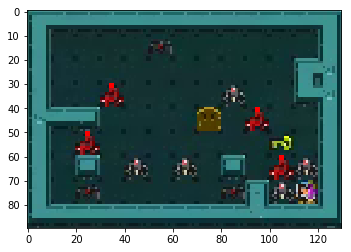

(90, 130, 3)
(90, 130, 3)


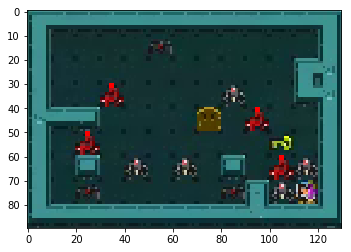

(90, 130, 3)
(90, 130, 3)


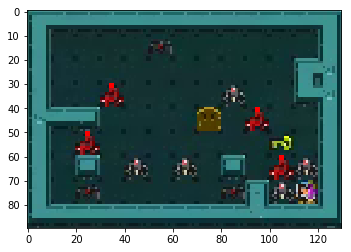

(90, 130, 3)
(90, 130, 3)


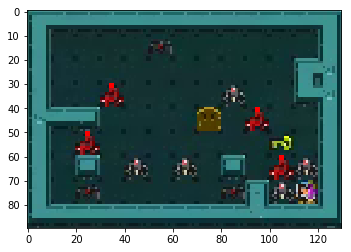

(90, 130, 3)
(90, 130, 3)


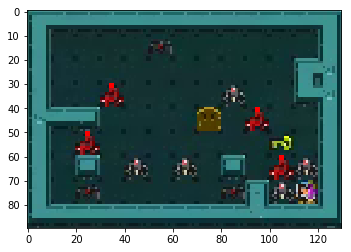

(90, 130, 3)
(90, 130, 3)


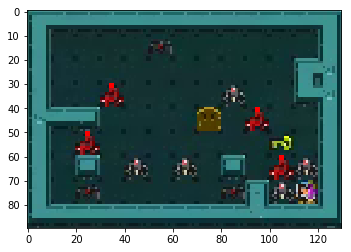

(90, 130, 3)
(90, 130, 3)


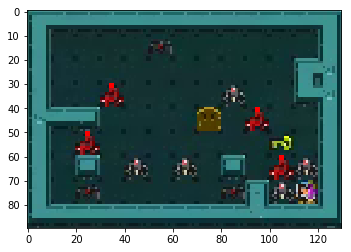

(90, 130, 3)
(90, 130, 3)


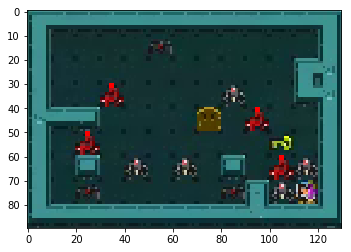

(90, 130, 3)
(90, 130, 3)


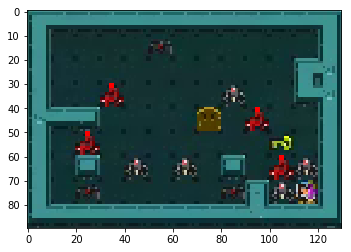

(90, 130, 3)
(90, 130, 3)


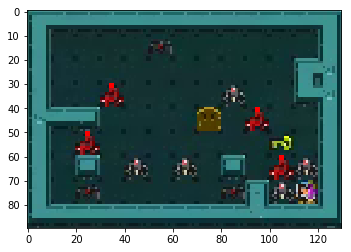

(90, 130, 3)
(90, 130, 3)


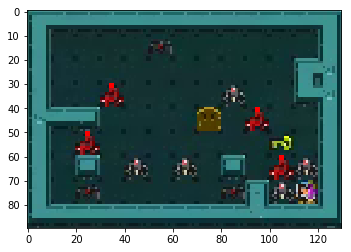

In [93]:
raw_data = []
for i in range(1,12):
    frames = []
    cap = cv2.VideoCapture("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(i) + "/1.mp4")
    success, img = cap.read()
    print(img.shape)
#     cv2.imwrite("test.png", cv2.cvtColor(img, cv2.COLOR_BGR2RGBA))
#     frames.append(img)
#     while success:
#         success, img = cap.read()
#         frames.append(img)
    print(img.shape)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGBA))
    plt.show()

In [12]:
os.path.isfile("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/1/1.mp4")

False

In [23]:
img = cv2.imread("test.png", cv2.IMREAD_UNCHANGED)
img.shape

(90, 130, 4)

In [39]:
with open("/home/jupyter/Notebooks/Chang/HardRLWithYoutube/samples/" + str(1) + "/1_reward.txt") as f:
#         actions = f.readlines()
        print([float(i.rstrip("\t \n")) for i in f])
#         print(list(map(ac.index,[i.rstrip("\t \n") for i in f][1:])))


[0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Images will be recorded to recorded_images/
Image shape: (90, 130, 3)


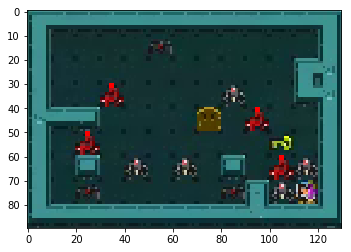

5
0.0
False


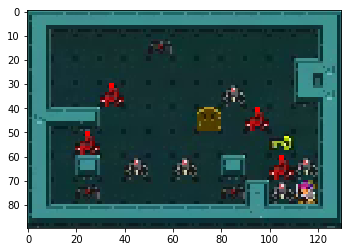

1
2.0
False


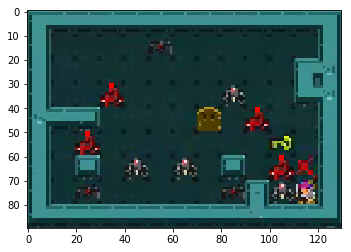

5
0.0
False


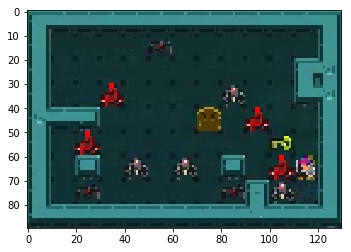

5
0.0
False


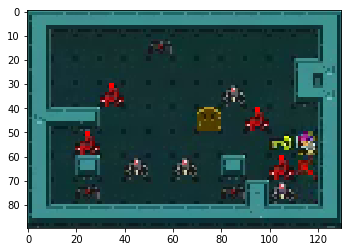

2
0.0
False


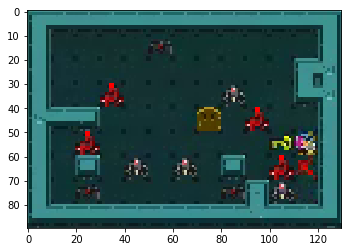

2
1.0
False


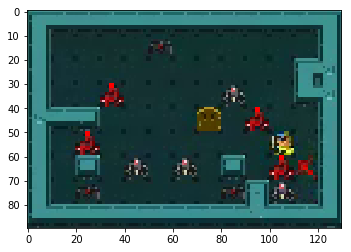

1
0.0
False


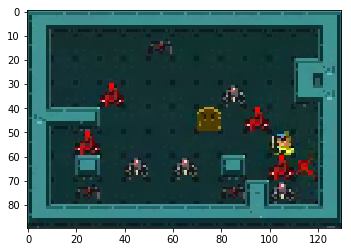

4
0.0
False


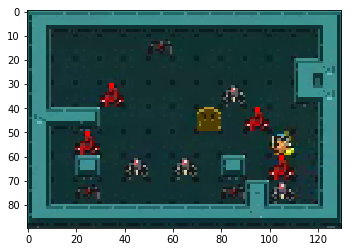

1
2.0
False


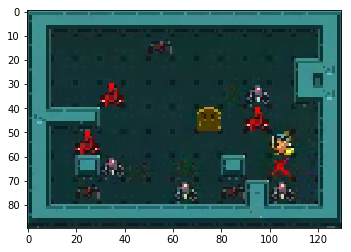

2
0.0
False


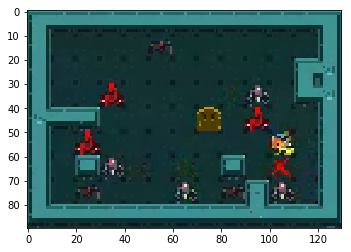

2
0.0
False


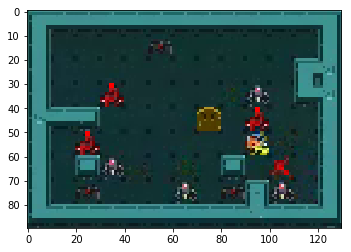

2
0.0
False


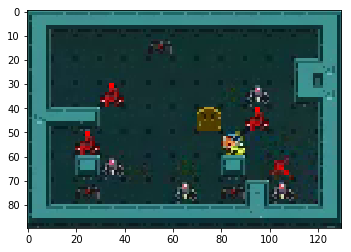

2
0.0
False


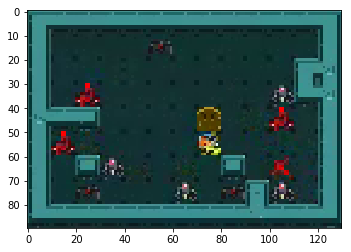

5
0.0
False


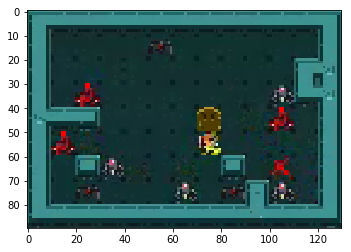

5
1.0
True
1


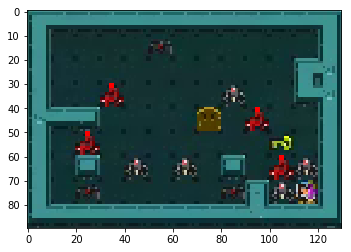

5
0.0
False


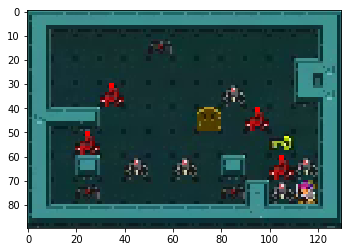

1
2.0
False


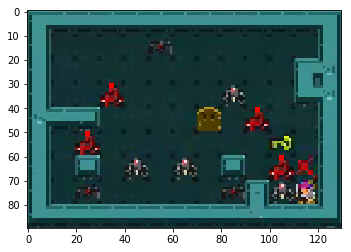

5
0.0
False


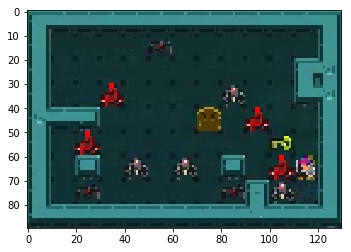

5
0.0
False


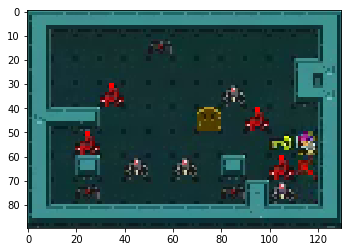

2
0.0
False


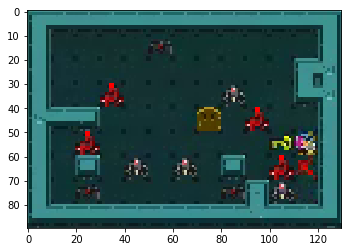

2
1.0
False


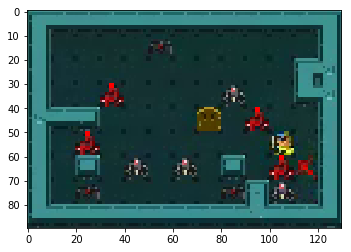

5
0.0
False


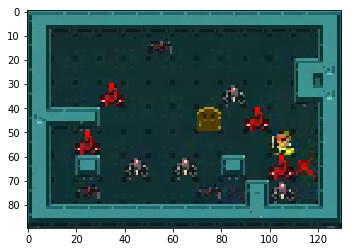

4
0.0
False


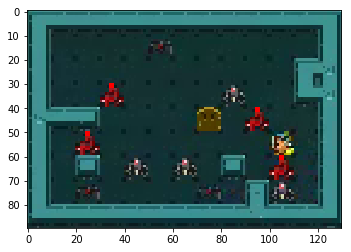

1
2.0
False


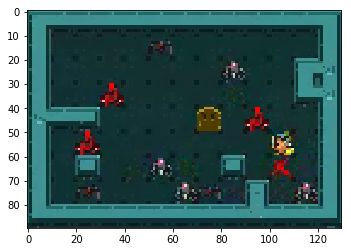

4
0.0
False


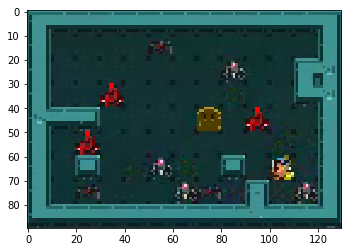

2
0.0
False


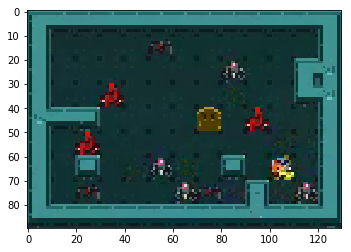

2
0.0
False


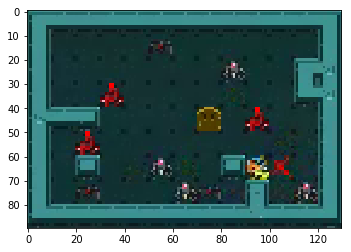

1
0.0
False


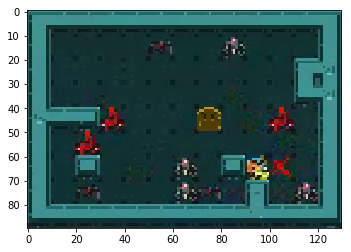

5
0.0
False


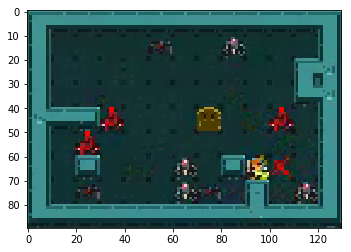

5
0.0
False


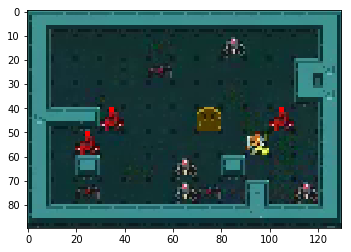

5
0.0
False


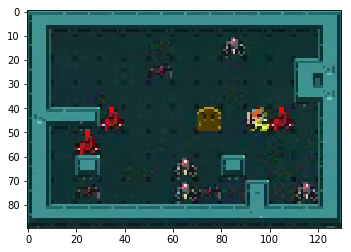

2
0.0
False


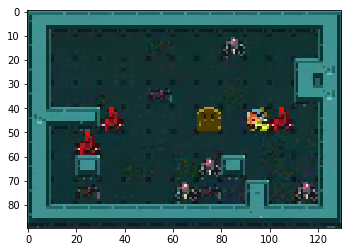

2
0.0
False


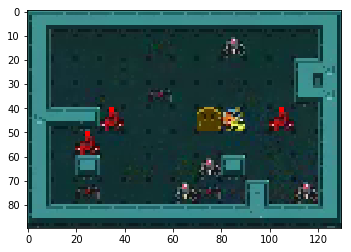

2
1.0
True
2


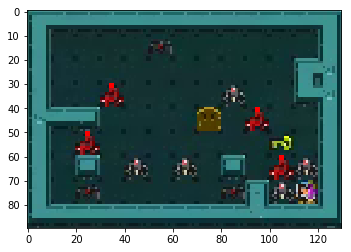

5
0.0
False


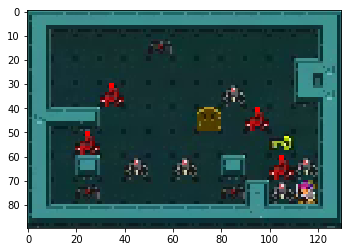

1
2.0
False


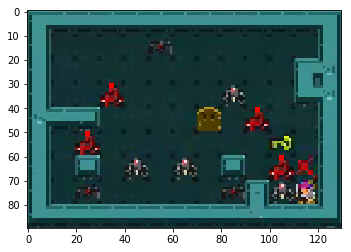

3
0.0
False


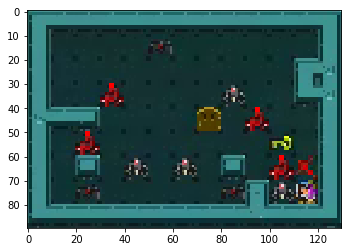

1
0.0
False


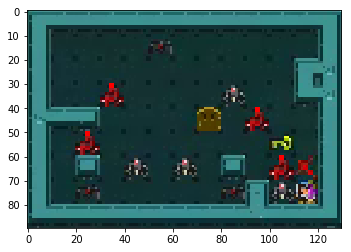

3
0.0
False


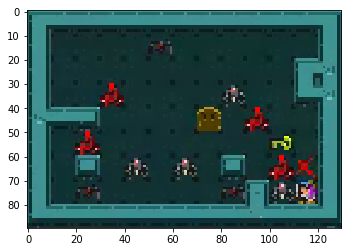

5
0.0
False


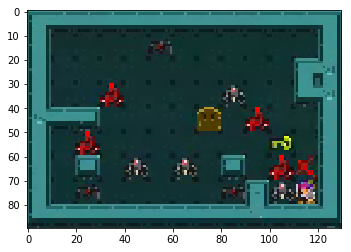

5
0.0
False


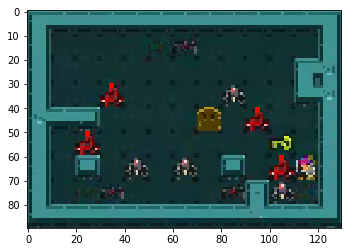

5
0.0
False


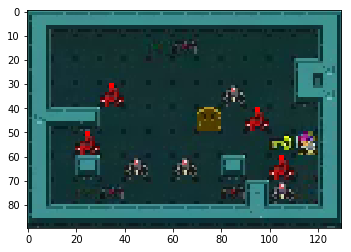

2
0.0
False


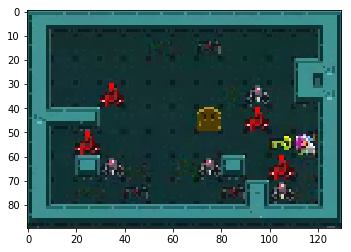

2
1.0
False


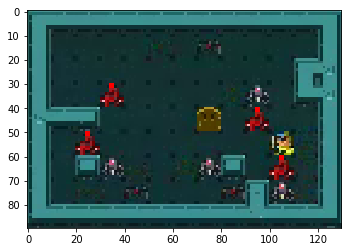

2
0.0
False


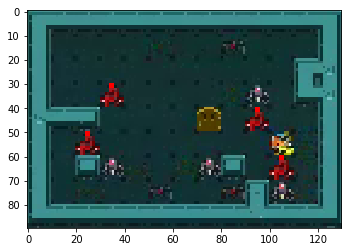

2
0.0
False


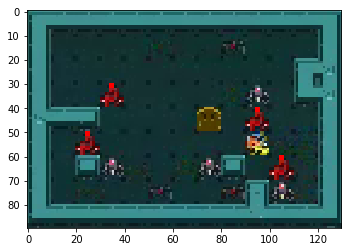

2
0.0
False


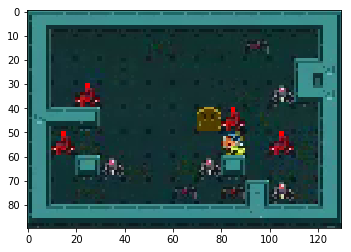

5
0.0
False


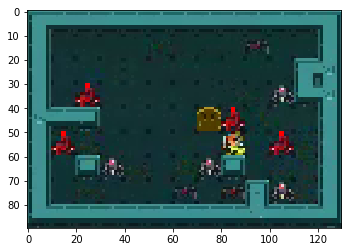

1
2.0
False


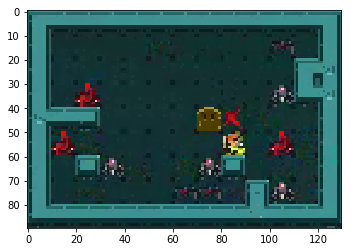

5
0.0
False


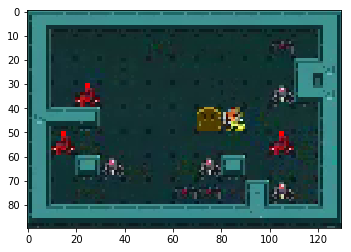

4
0.0
False


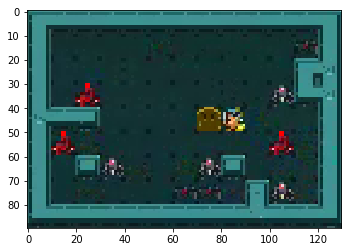

3
0.0
False


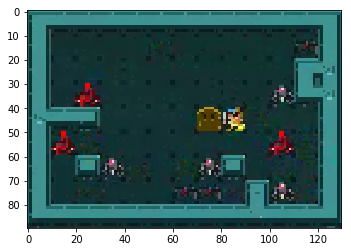

2
0.0
False


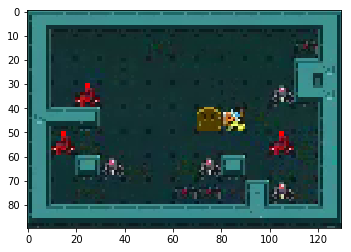

2
1.0
True
3


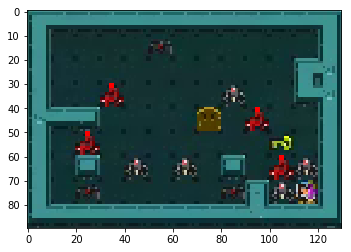

5
0.0
False


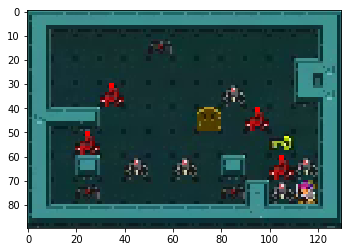

1
2.0
False


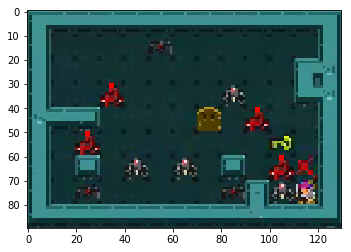

5
0.0
False


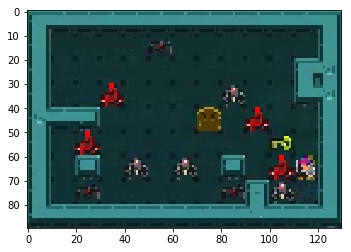

5
0.0
False


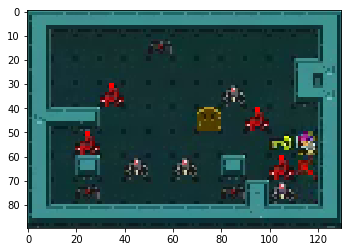

2
0.0
False


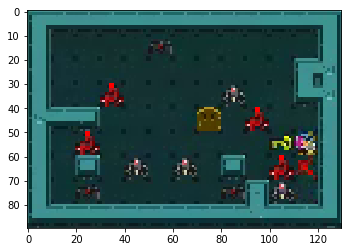

2
1.0
False


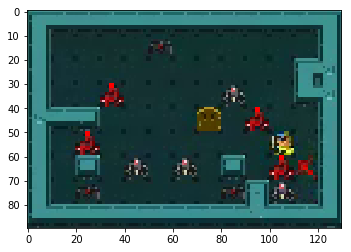

5
0.0
False


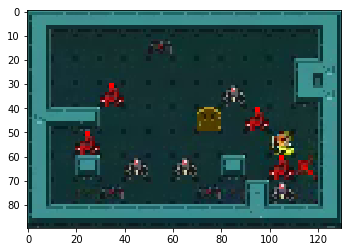

4
0.0
False


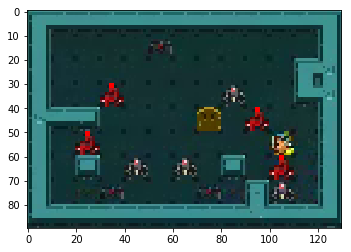

1
2.0
False


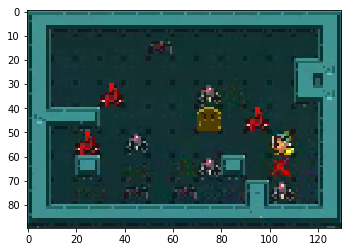

5
0.0
False


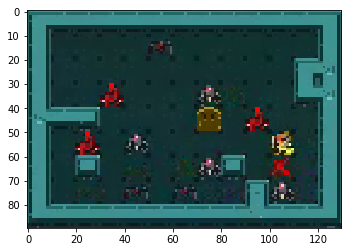

2
0.0
False


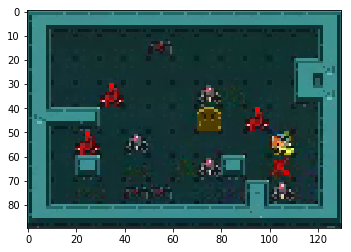

5
0.0
False


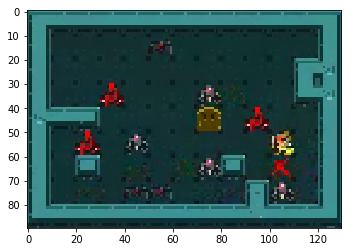

2
0.0
False


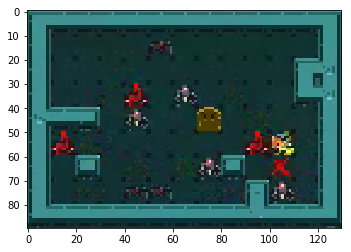

5
0.0
False


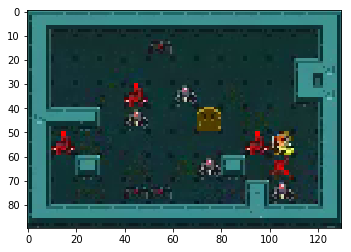

2
0.0
False


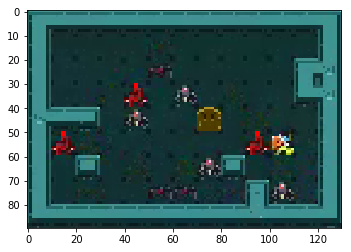

1
2.0
False


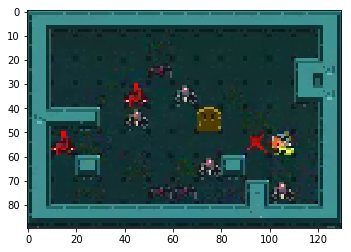

2
0.0
False


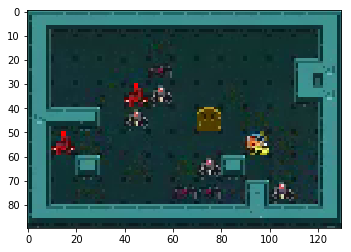

2
0.0
False


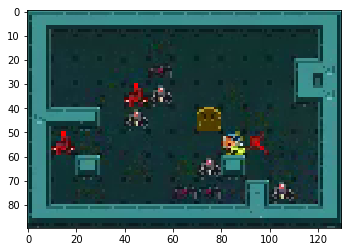

2
0.0
False


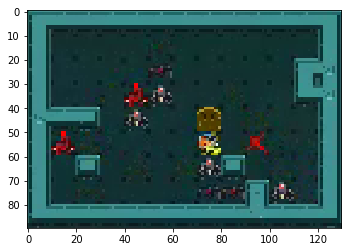

5
0.0
False


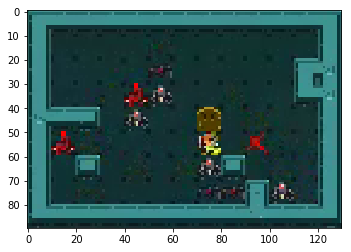

5
1.0
True
4


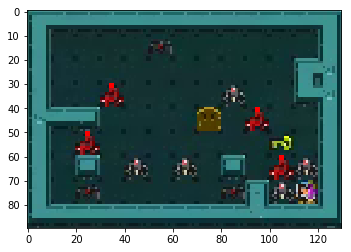

2
0.0
False


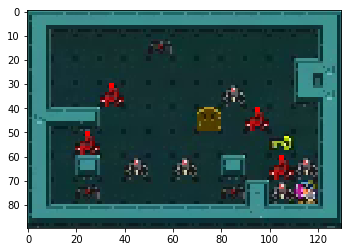

1
2.0
False


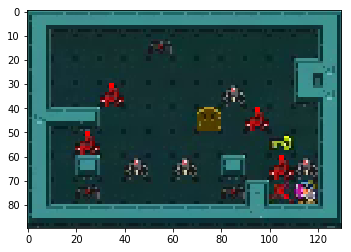

1
0.0
False


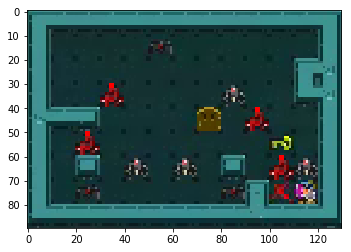

5
0.0
False


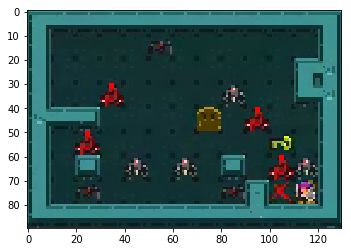

2
0.0
False


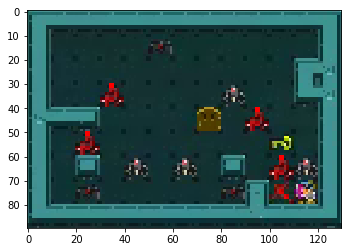

2
0.0
False


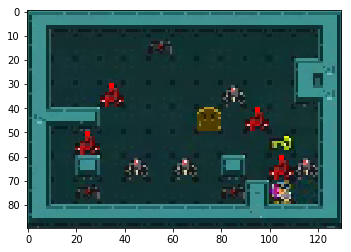

5
0.0
False


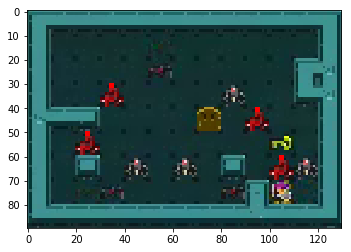

1
0.0
False


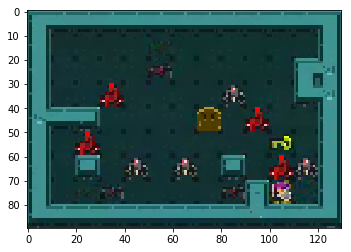

1
4.0
False


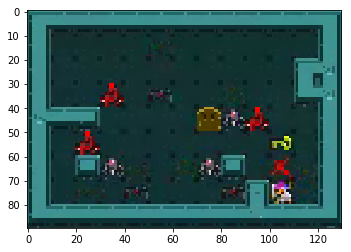

5
0.0
False


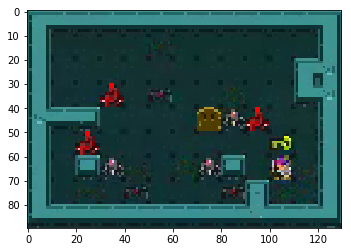

1
0.0
False


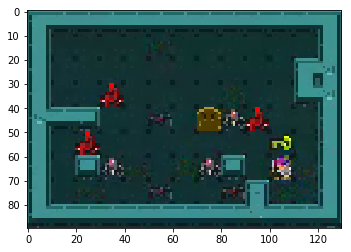

5
1.0
False


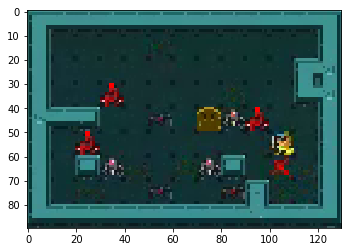

2
0.0
False


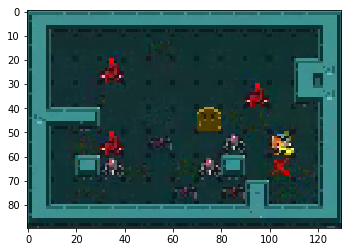

5
0.0
False


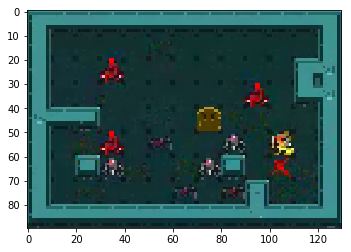

5
0.0
False


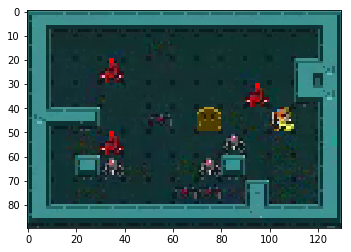

5
0.0
False


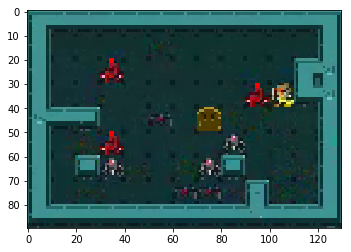

2
0.0
False


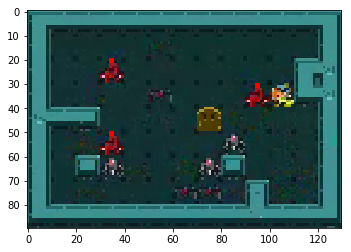

1
2.0
False


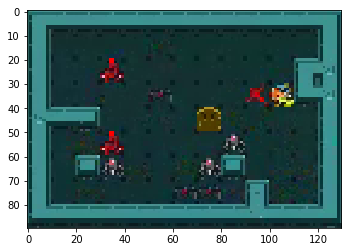

2
0.0
False


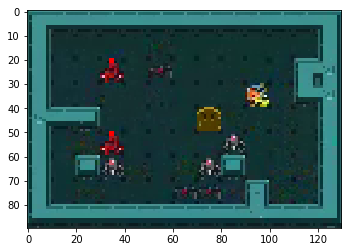

2
0.0
False


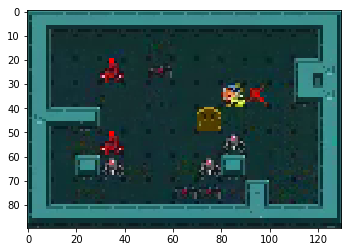

2
0.0
False


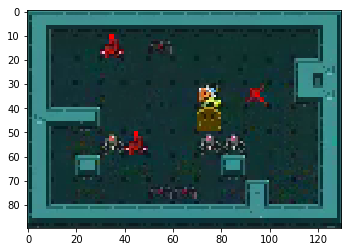

4
0.0
False


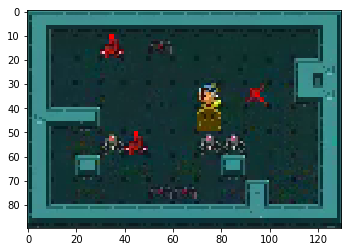

1
0.0
False


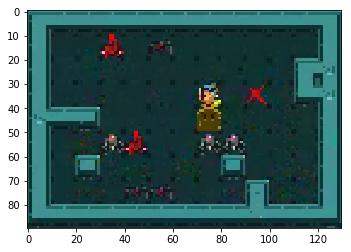

4
1.0
True
5


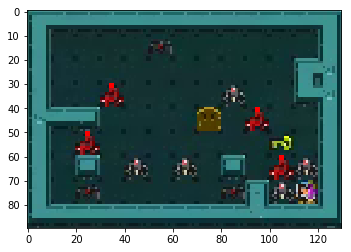

5
0.0
False


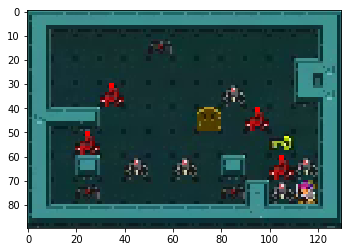

1
2.0
False


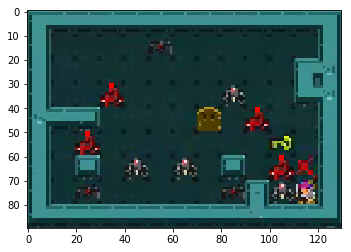

2
0.0
False


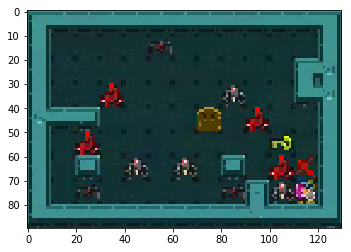

1
0.0
False


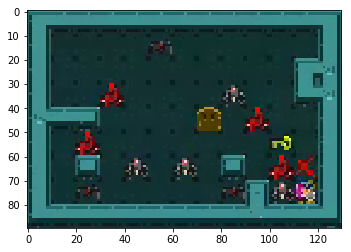

1
0.0
False


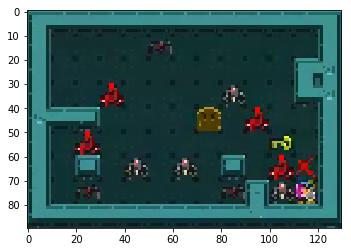

4
0.0
False


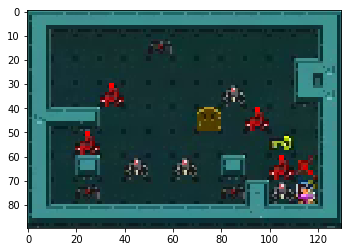

3
0.0
False


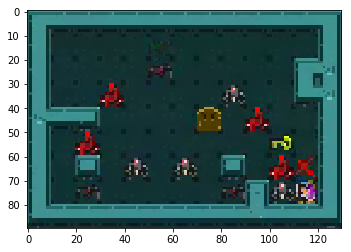

5
0.0
False


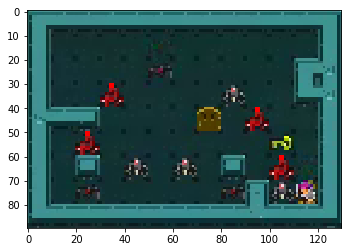

5
0.0
False


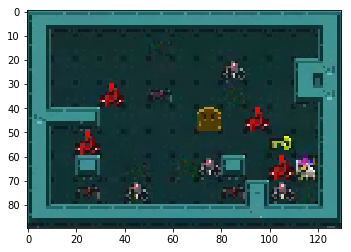

2
0.0
False


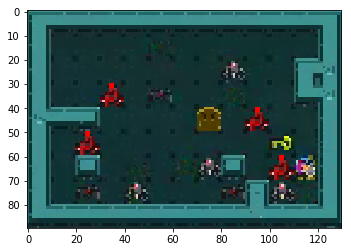

1
2.0
False


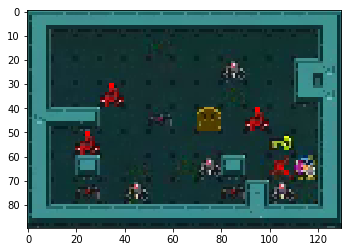

5
0.0
False


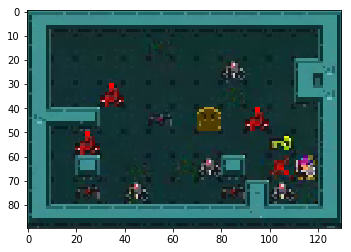

5
2.0
False


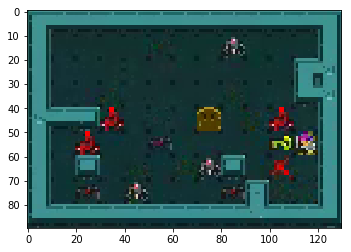

1
0.0
False


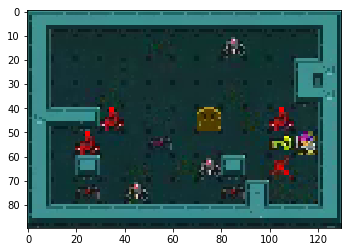

2
0.0
False


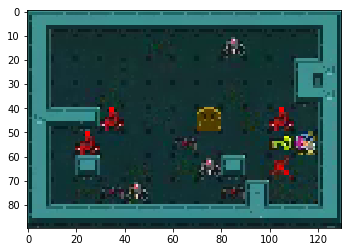

1
0.0
False


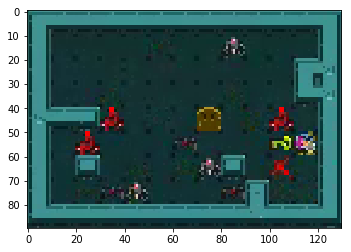

2
1.0
False


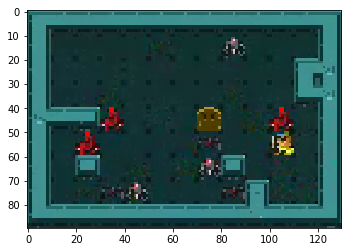

4
0.0
False


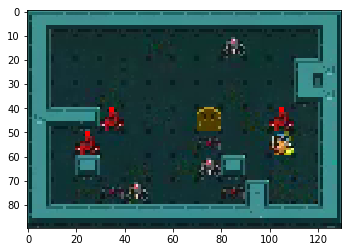

5
0.0
False


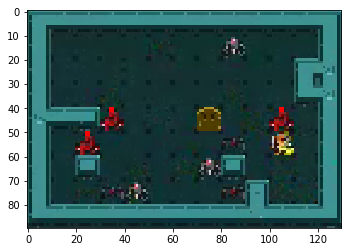

2
0.0
False


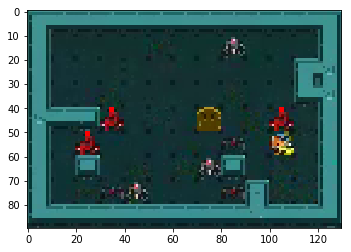

3
0.0
False


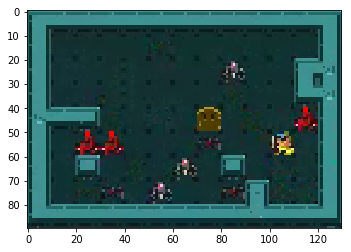

5
0.0
False


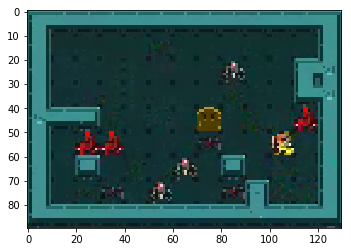

3
0.0
False


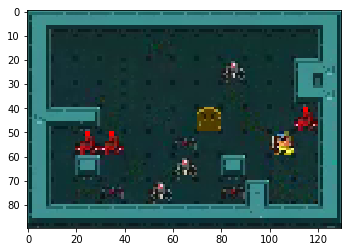

5
0.0
False


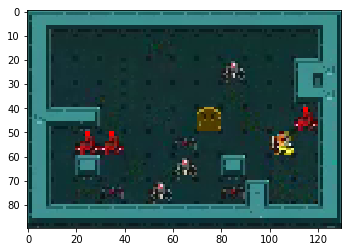

5
0.0
False


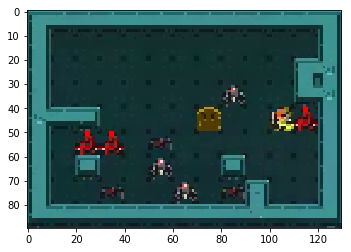

3
0.0
False


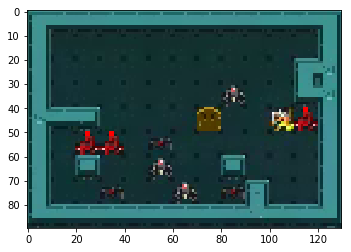

5
0.0
False


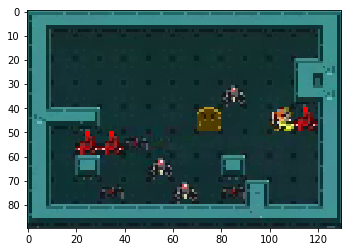

2
0.0
False


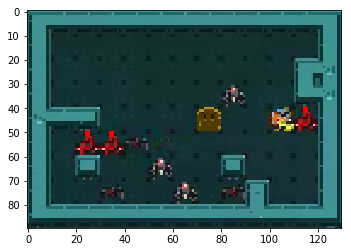

4
0.0
False


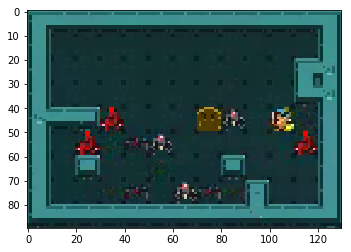

3
0.0
False


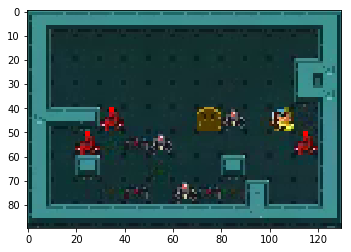

2
0.0
False


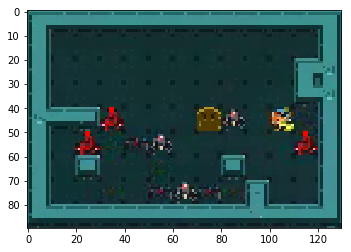

2
0.0
False


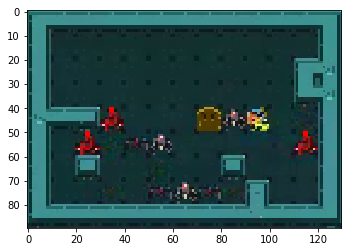

2
0.0
False


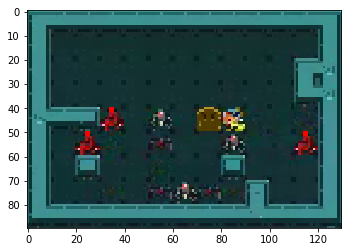

2
1.0
True
6


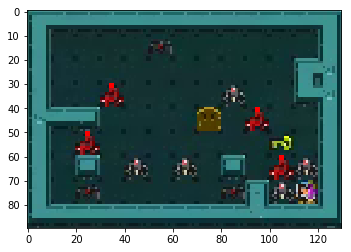

2
0.0
False


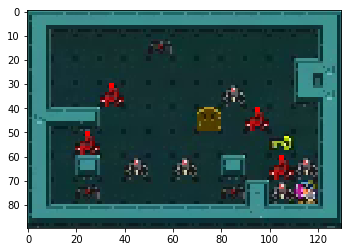

5
0.0
False


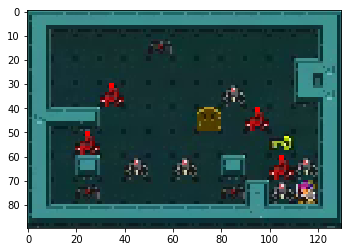

1
2.0
False


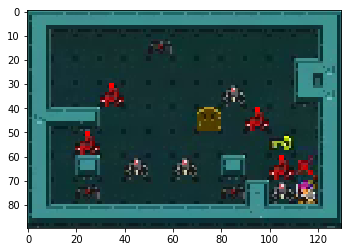

2
0.0
False


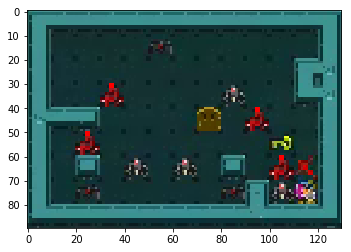

5
0.0
False


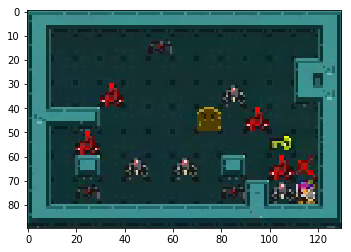

5
0.0
False


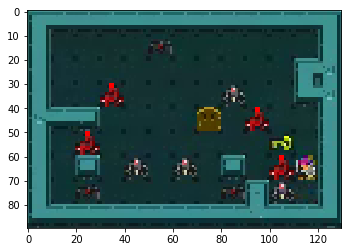

2
0.0
False


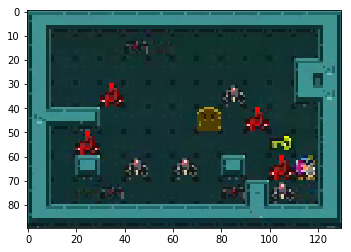

1
0.0
False


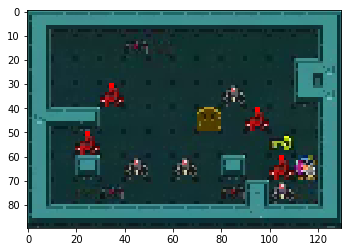

5
0.0
False


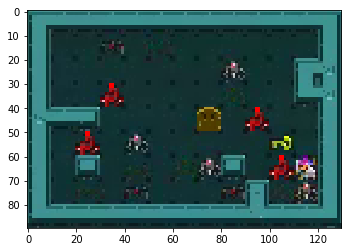

2
0.0
False


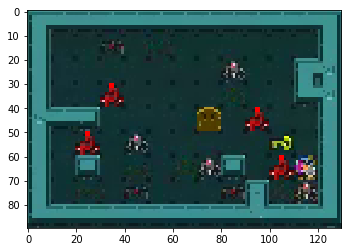

1
2.0
False


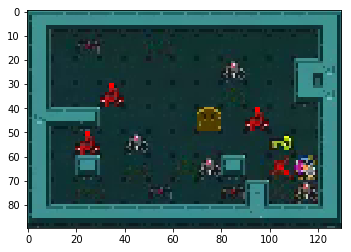

5
0.0
False


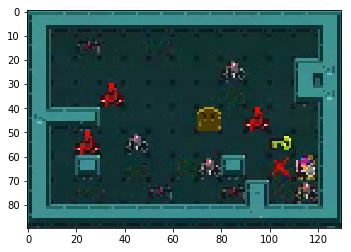

2
0.0
False


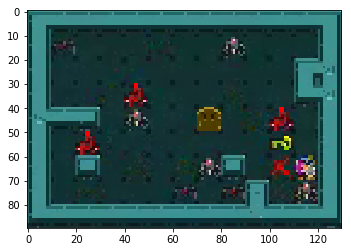

2
0.0
False


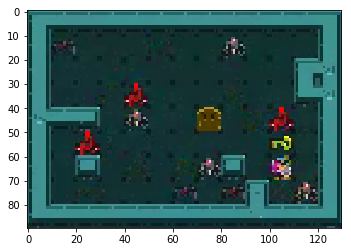

3
0.0
False


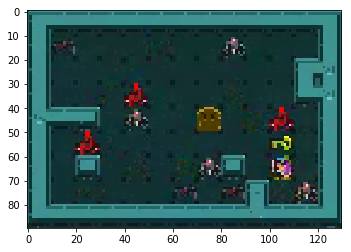

5
0.0
False


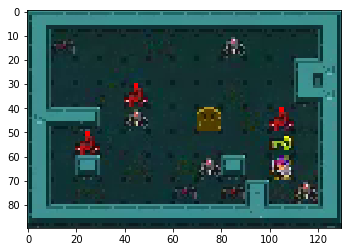

5
1.0
False


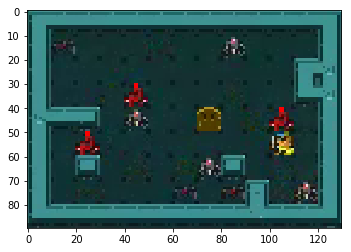

1
0.0
False


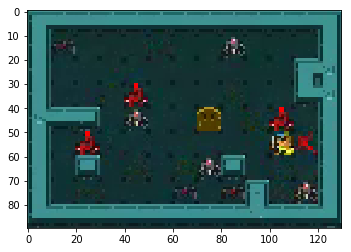

2
0.0
False


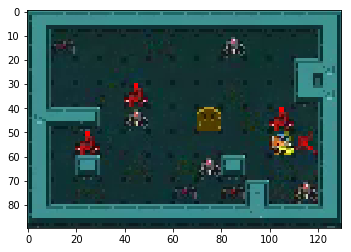

2
0.0
False


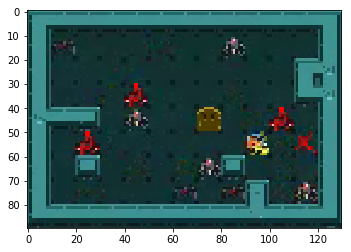

3
0.0
False


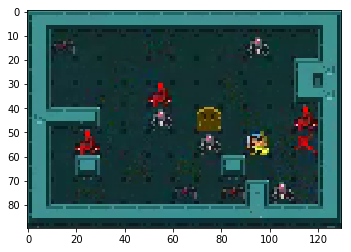

2
0.0
False


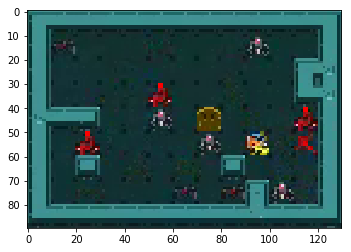

4
0.0
False


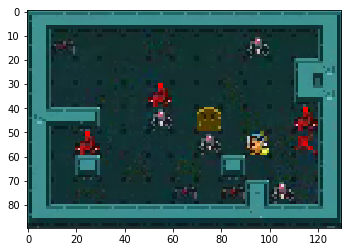

2
0.0
False


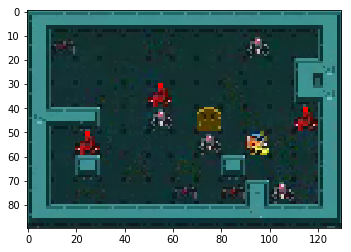

1
0.0
False


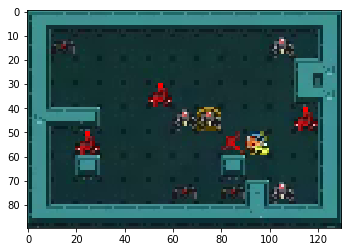

5
0.0
False


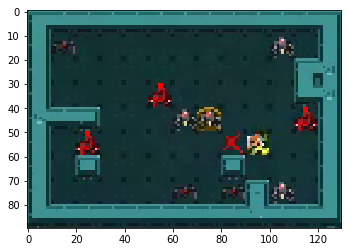

5
0.0
False


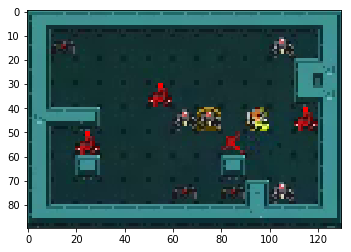

5
0.0
False


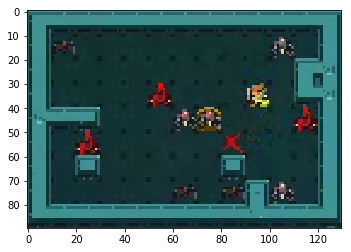

3
0.0
False


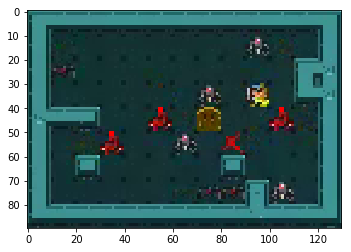

1
0.0
False


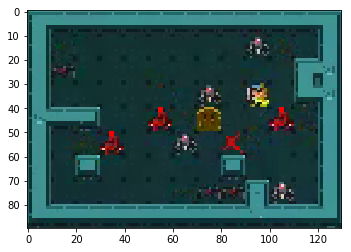

4
0.0
False


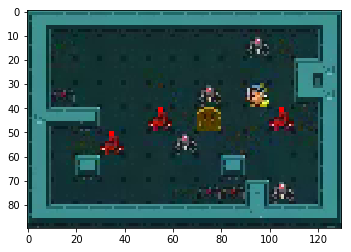

1
0.0
False


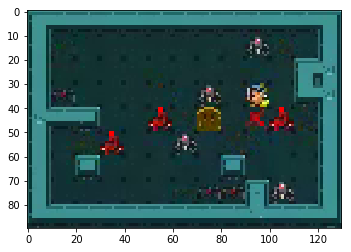

4
0.0
False


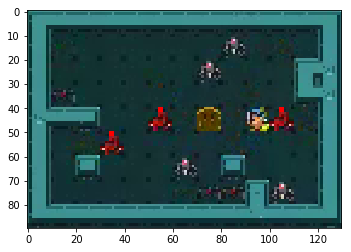

2
0.0
False


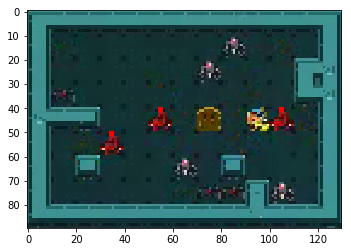

2
0.0
False


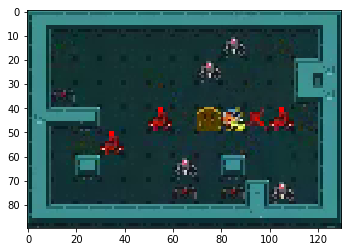

1
0.0
False


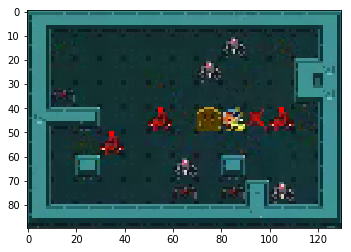

2
3.0
True
7


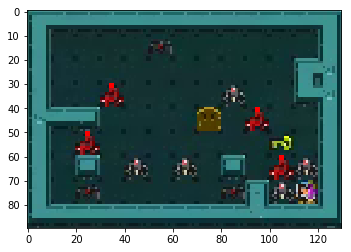

5
0.0
False


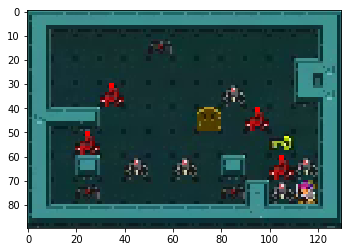

1
2.0
False


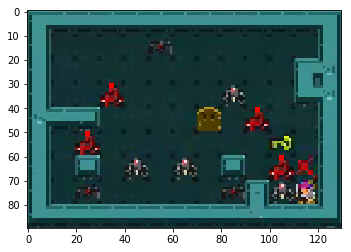

1
0.0
False


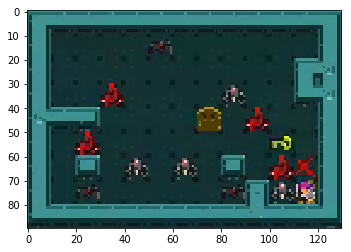

5
0.0
False


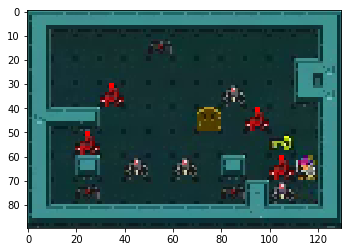

5
0.0
False


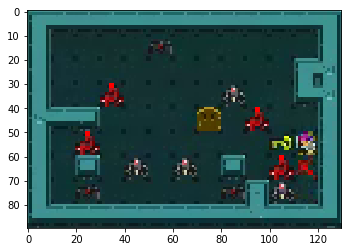

2
0.0
False


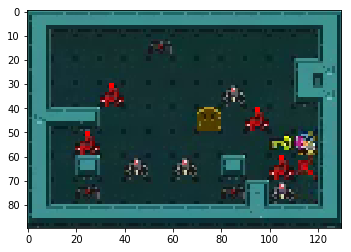

1
0.0
False


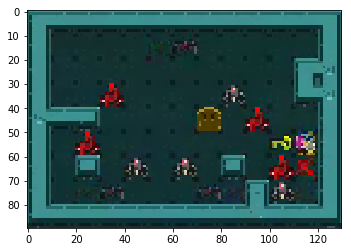

5
0.0
False


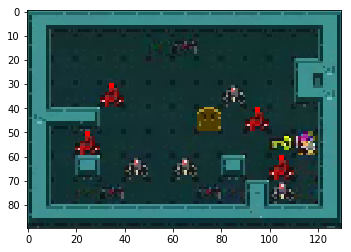

3
0.0
False


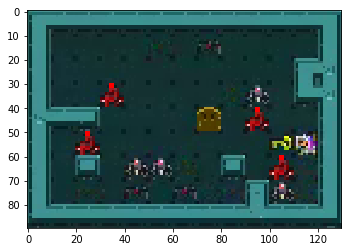

1
0.0
False


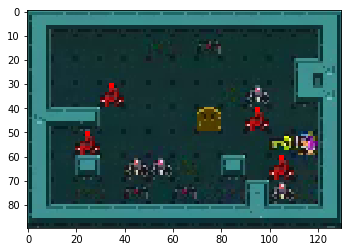

2
0.0
False


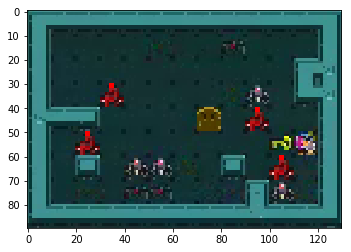

4
0.0
False


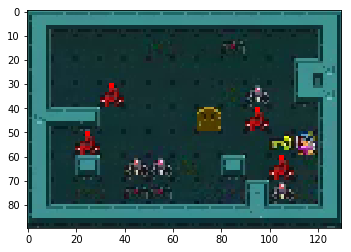

2
0.0
False


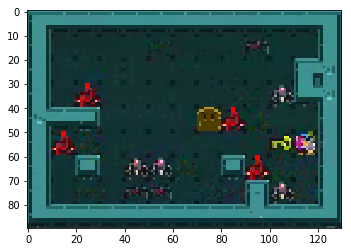

2
1.0
False


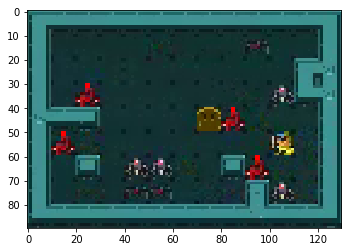

1
0.0
False


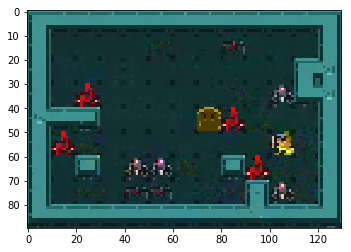

2
0.0
False


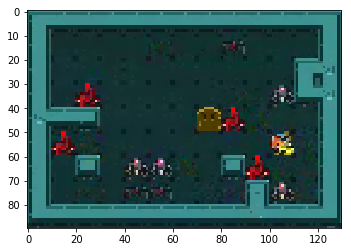

5
0.0
False


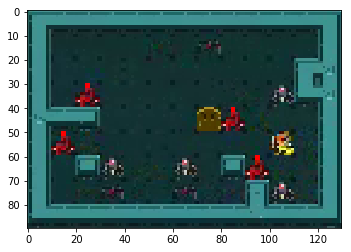

1
0.0
False


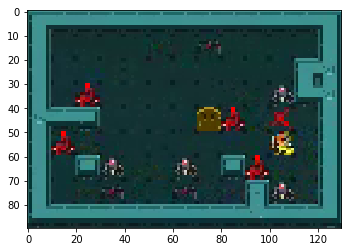

5
0.0
False


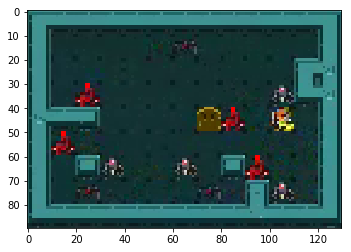

4
0.0
False


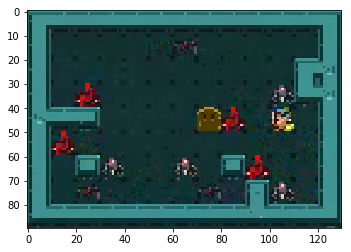

4
0.0
False


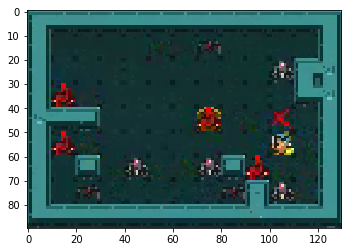

3
0.0
False


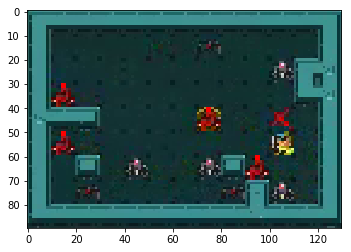

2
0.0
False


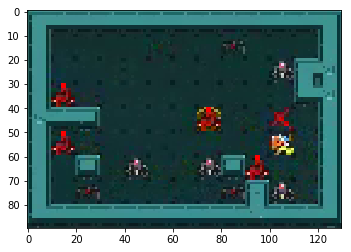

4
0.0
False


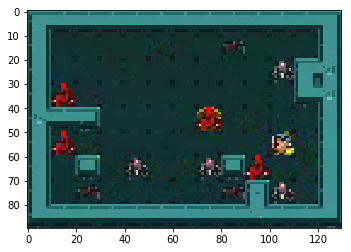

2
0.0
False


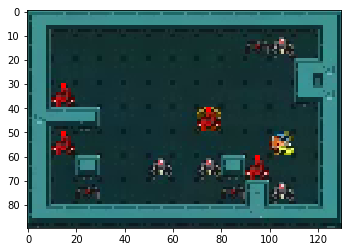

2
0.0
False


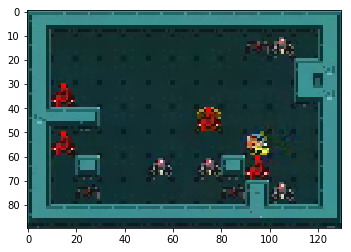

2
0.0
False


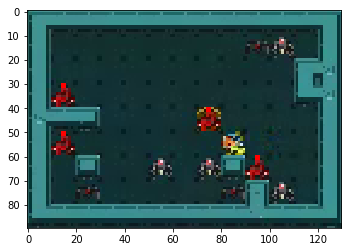

5
0.0
False


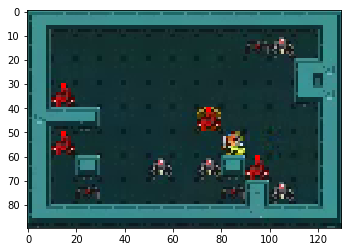

5
0.0
False


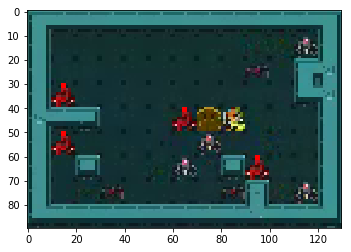

4
0.0
False


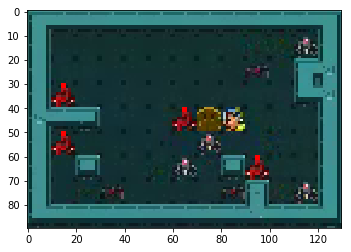

2
0.0
False


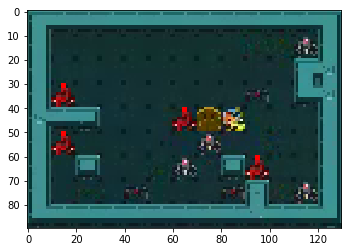

1
0.0
False


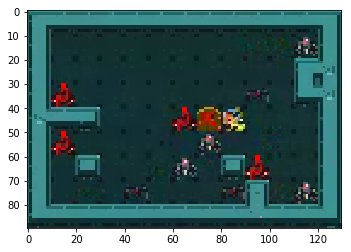

4
2.0
False


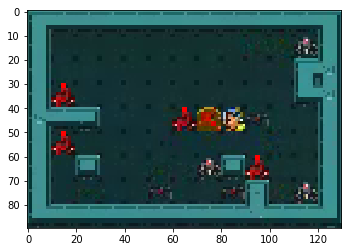

4
0.0
False


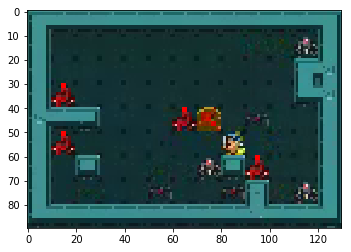

5
0.0
False


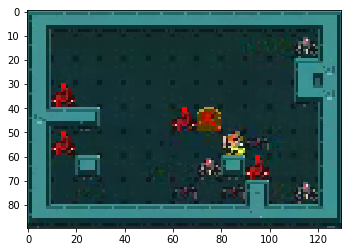

3
0.0
False


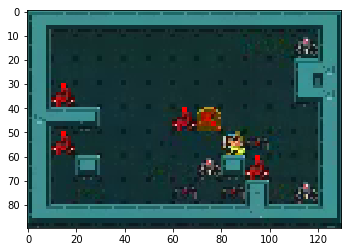

5
0.0
False


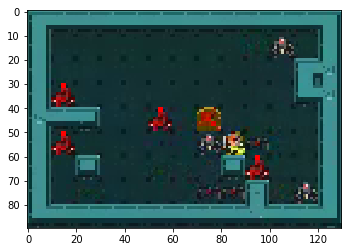

5
0.0
False


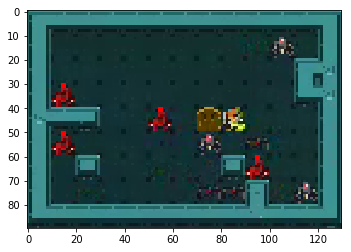

3
0.0
False


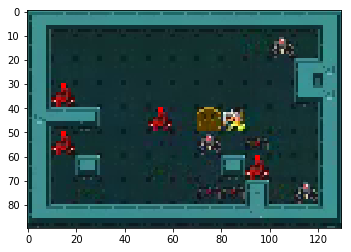

2
0.0
False


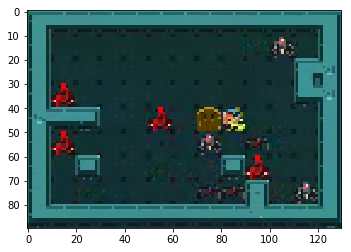

2
0.0
True
8


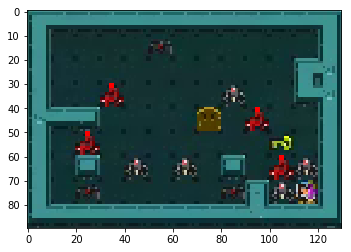

2
0.0
False


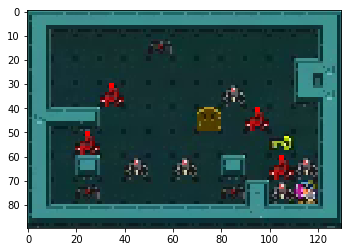

1
2.0
False


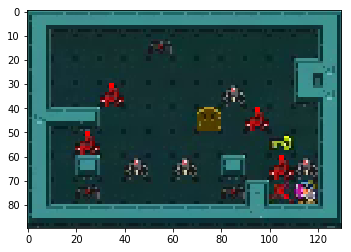

2
0.0
False


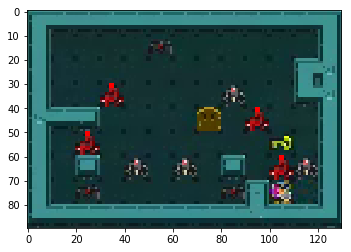

1
0.0
False


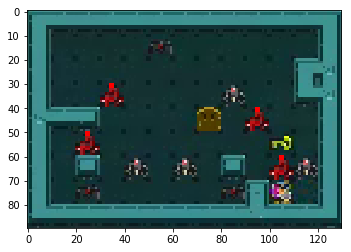

0
0.0
False


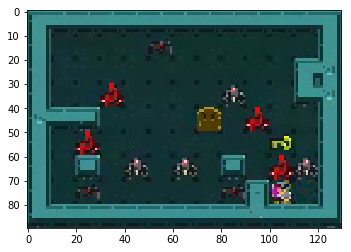

2
0.0
False


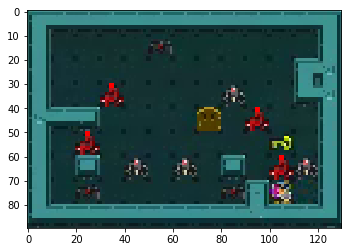

3
0.0
False


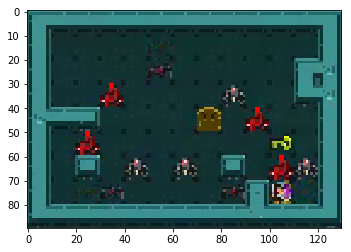

3
0.0
False


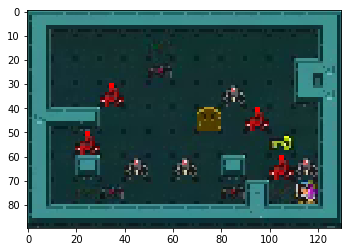

5
0.0
False


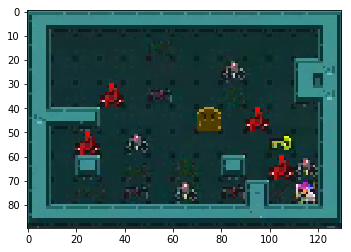

1
2.0
False


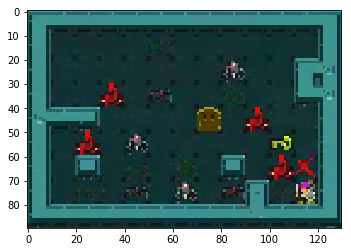

2
0.0
False


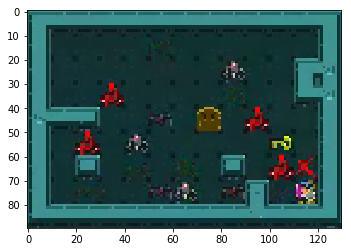

3
0.0
False


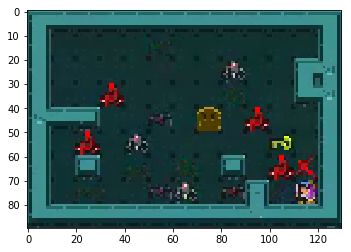

5
0.0
False


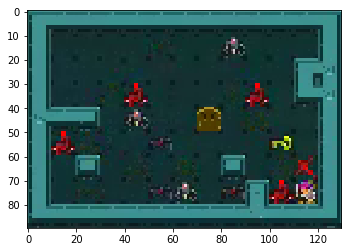

3
0.0
False


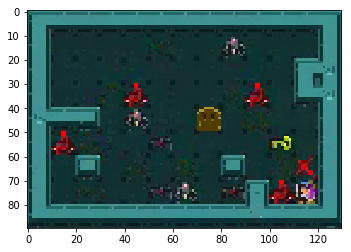

3
0.0
False


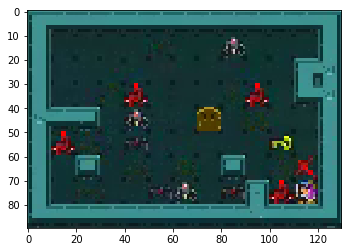

2
0.0
False


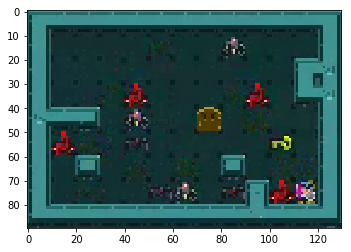

1
2.0
False


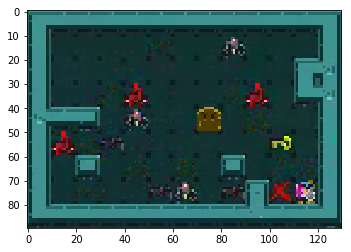

2
0.0
False


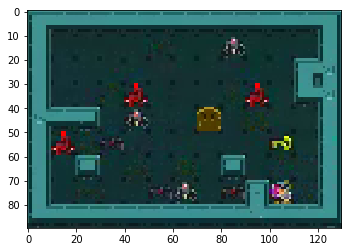

3
0.0
False


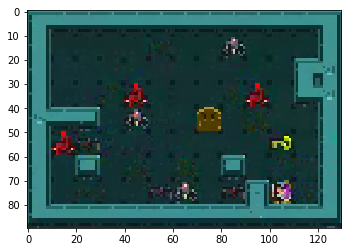

5
0.0
False


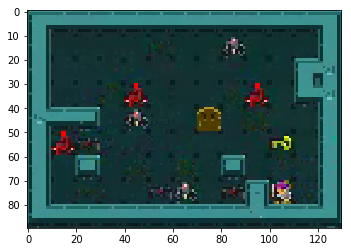

3
0.0
False


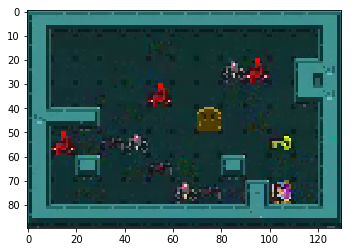

5
0.0
False


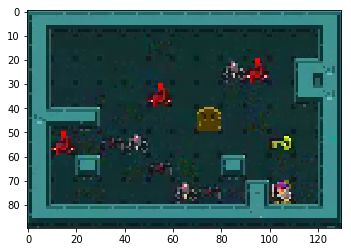

4
0.0
False


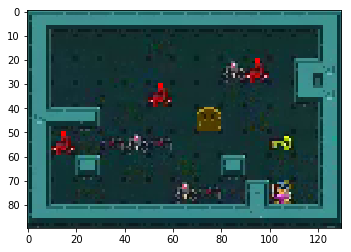

3
0.0
False


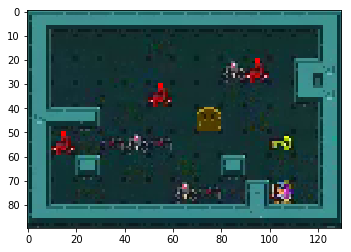

4
0.0
False


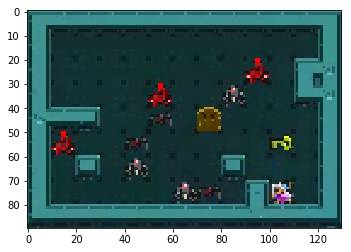

2
0.0
False


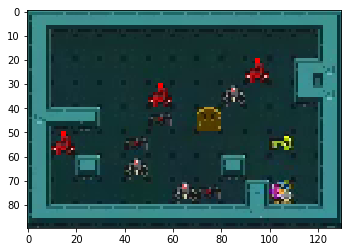

4
0.0
False


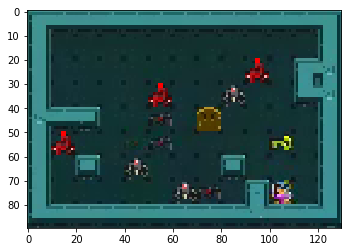

2
0.0
False


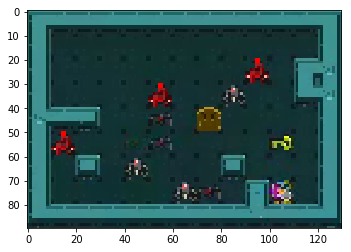

5
0.0
False


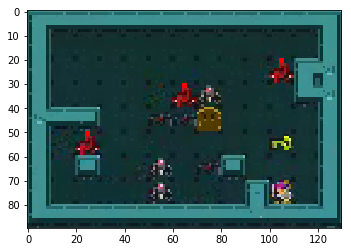

5
0.0
False


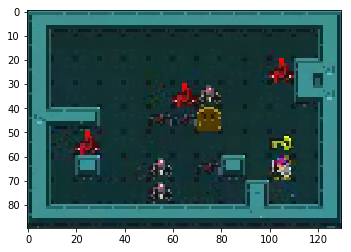

5
1.0
False


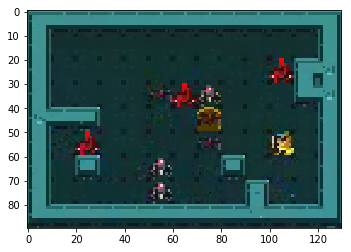

5
0.0
False


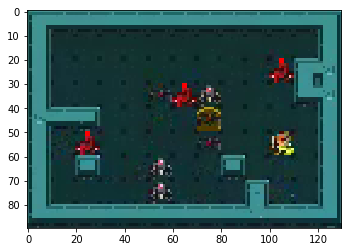

1
0.0
False


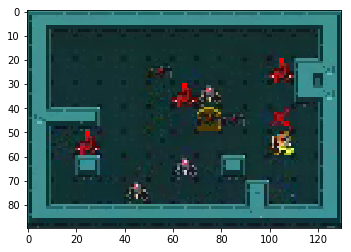

3
0.0
False


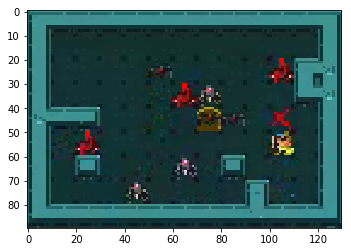

3
0.0
False


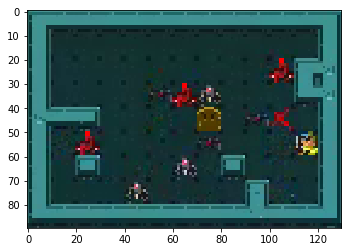

2
0.0
False


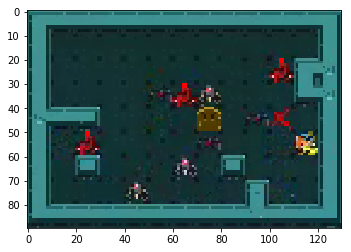

2
2.0
False


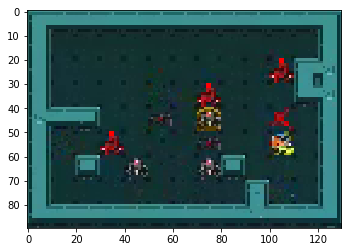

5
0.0
False


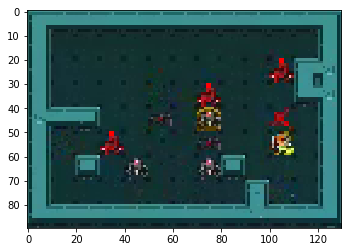

5
0.0
False


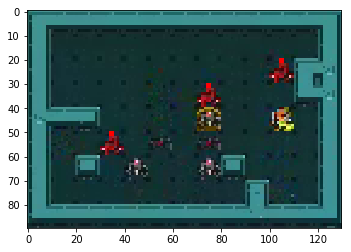

2
0.0
False


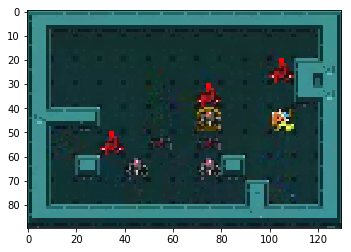

2
0.0
False


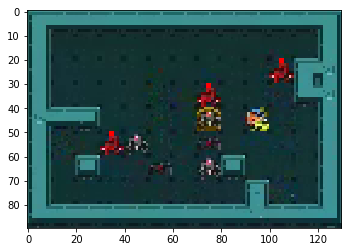

1
0.0
False


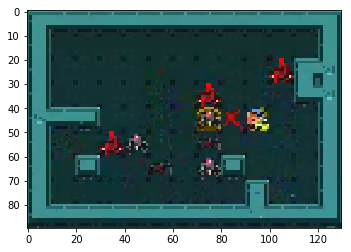

5
0.0
False


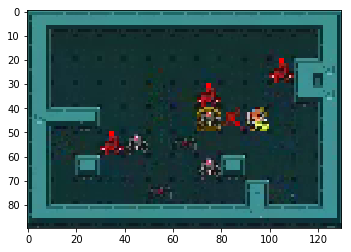

1
0.0
False


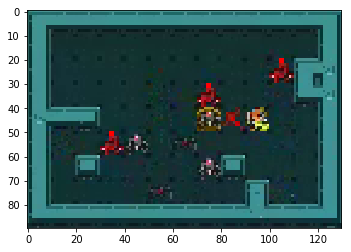

2
0.0
False


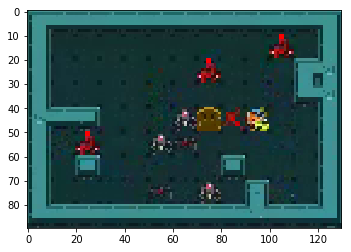

2
0.0
False


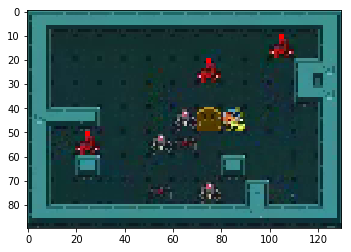

2
1.0
True
9


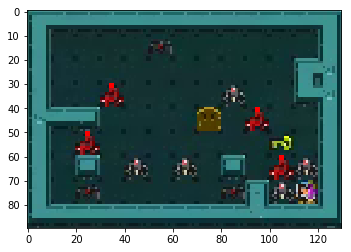

0
0.0
False


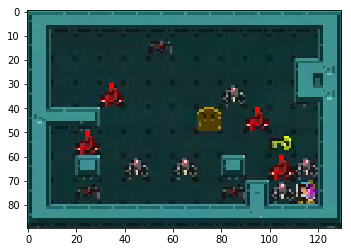

0
0.0
False


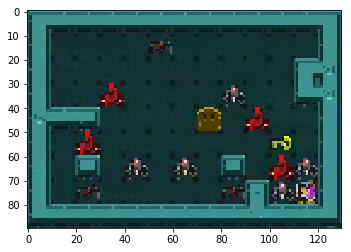

0
0.0
False


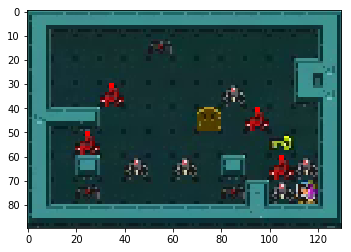

0
0.0
False


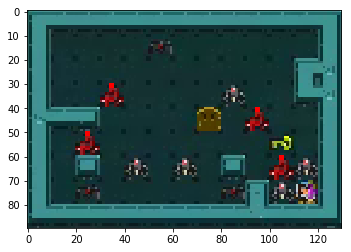

0
0.0
False


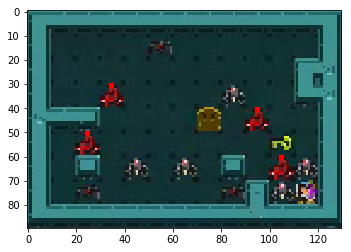

0
0.0
False


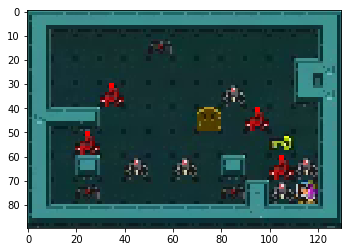

0
0.0
False


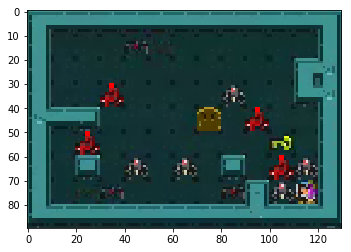

0
0.0
False


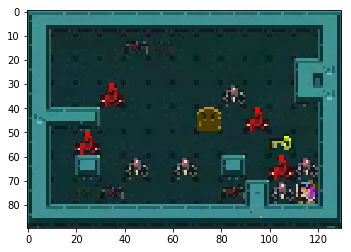

0
0.0
False


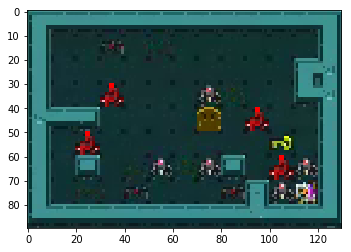

0
0.0
False


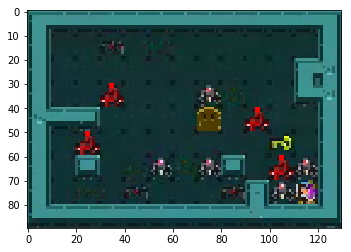

0
0.0
False


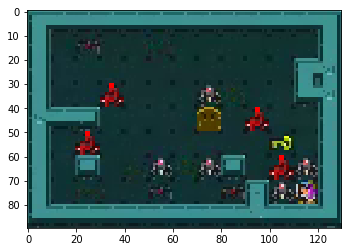

2
0.0
False


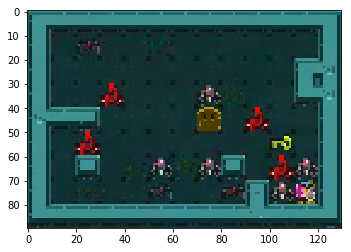

1
2.0
False


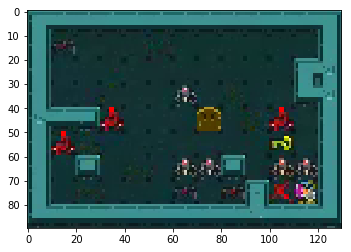

2
0.0
False


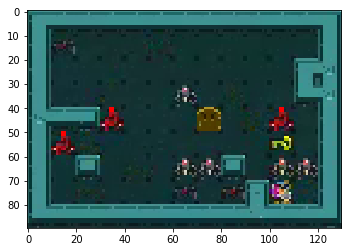

3
0.0
False


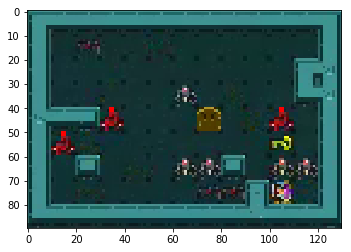

2
0.0
False


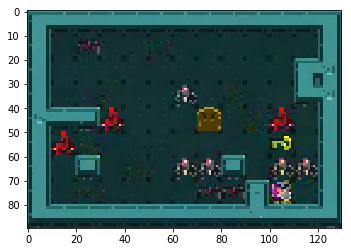

3
0.0
False


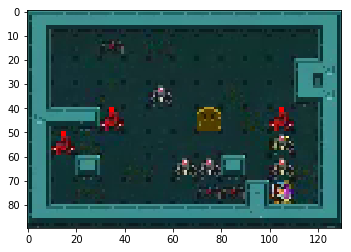

5
0.0
False


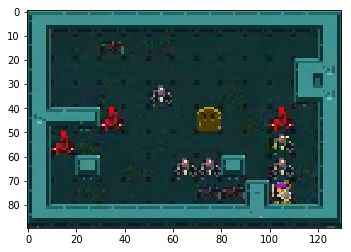

1
0.0
False


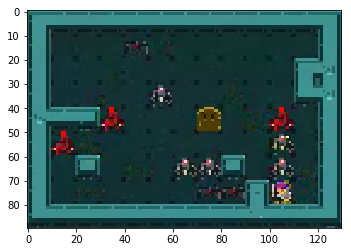

1
2.0
False


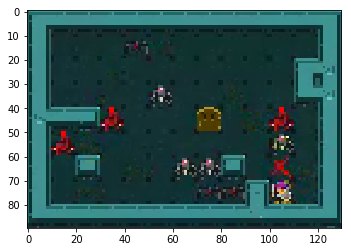

5
0.0
False


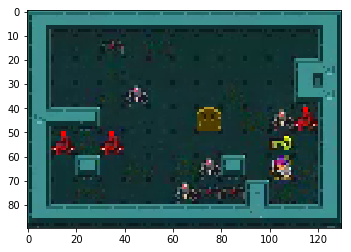

5
1.0
False


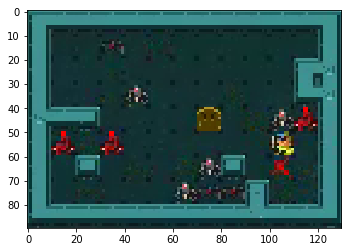

3
0.0
False


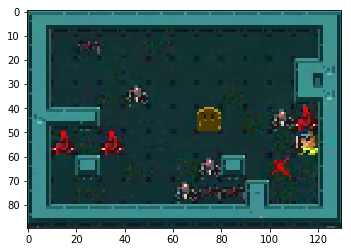

2
0.0
False


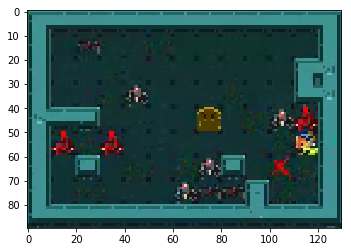

2
0.0
False


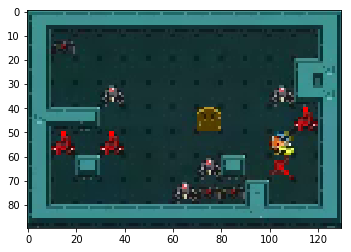

2
0.0
False


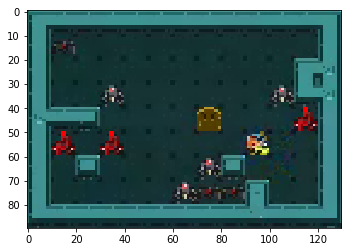

2
0.0
False


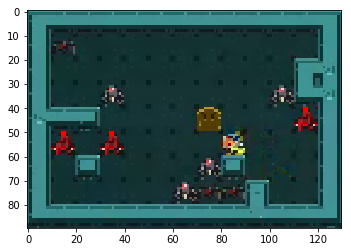

2
0.0
False


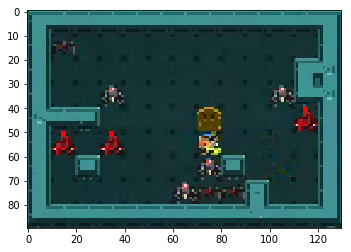

2
0.0
False


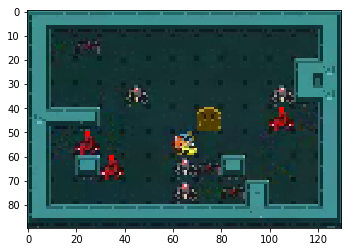

2
0.0
False


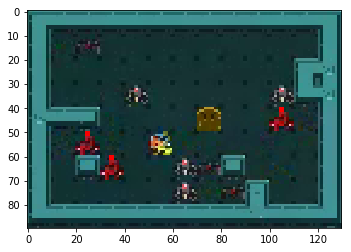

2
0.0
False


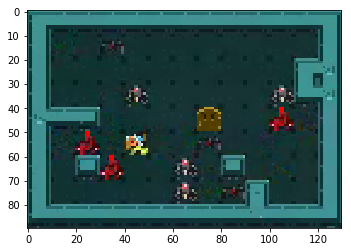

2
0.0
False


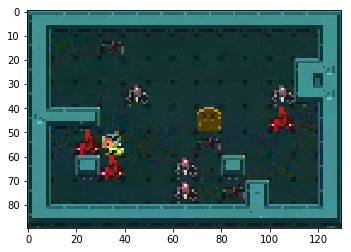

1
2.0
False


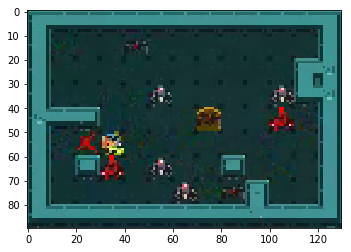

2
0.0
False


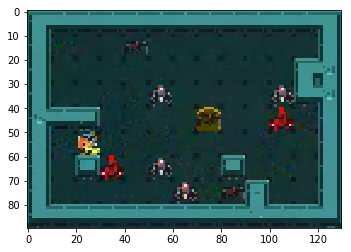

2
0.0
False


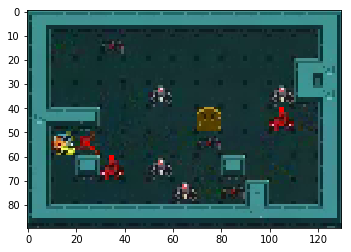

4
0.0
False


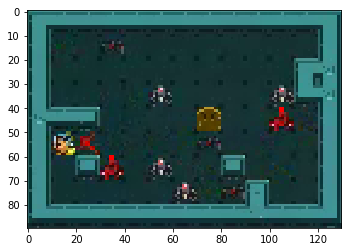

4
0.0
False


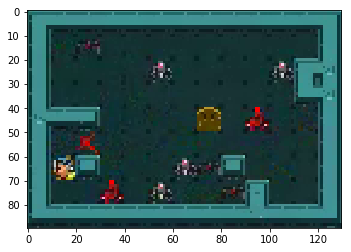

4
0.0
False


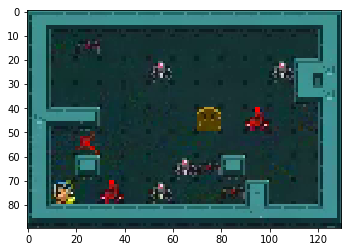

5
0.0
False


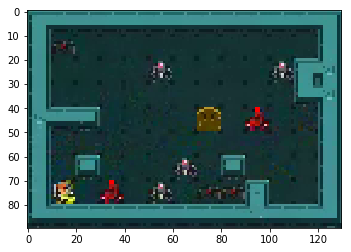

5
0.0
False


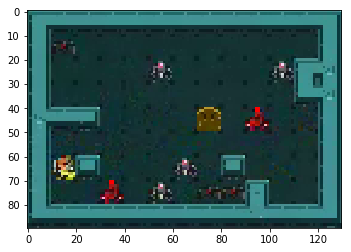

5
0.0
False


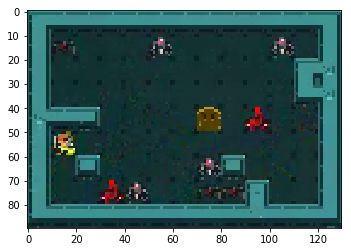

3
0.0
False


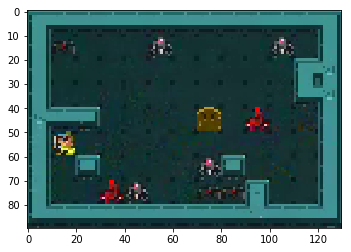

3
0.0
False


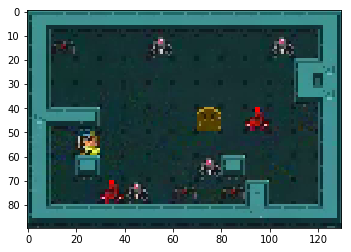

3
0.0
False


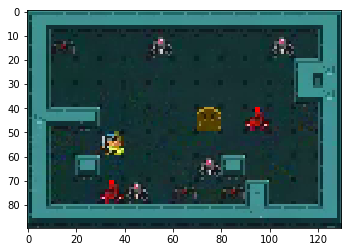

3
0.0
False


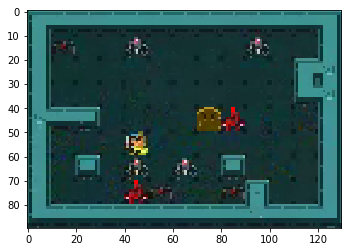

4
0.0
False


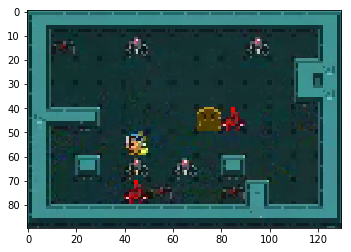

1
2.0
False


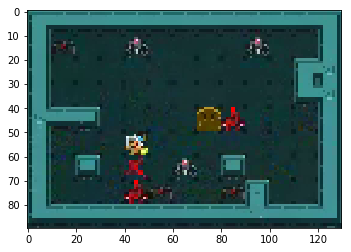

4
0.0
False


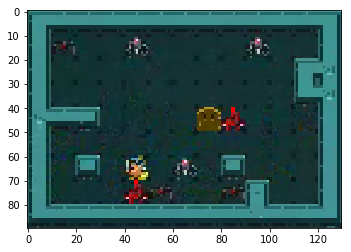

2
0.0
False


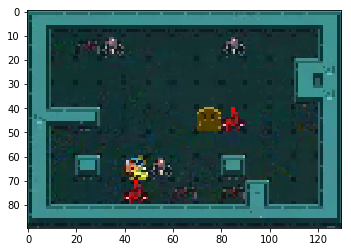

2
0.0
False


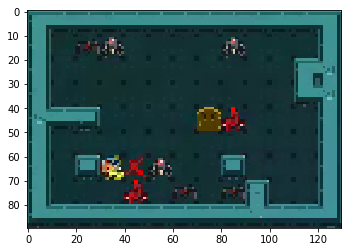

4
0.0
False


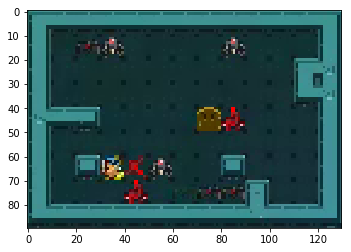

2
0.0
False


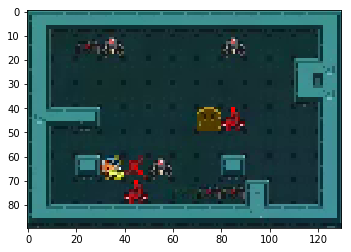

4
2.0
False


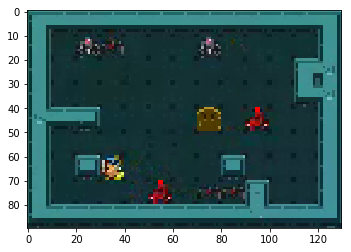

4
0.0
False


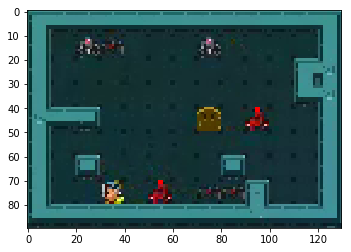

3
0.0
False


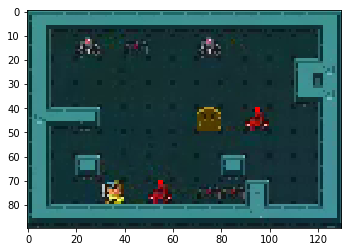

3
0.0
False


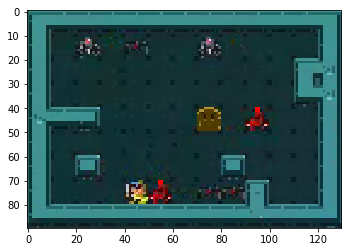

1
2.0
False


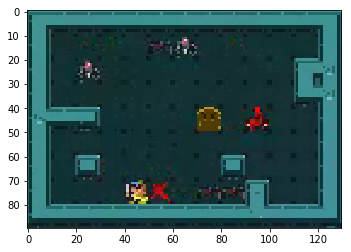

3
0.0
False


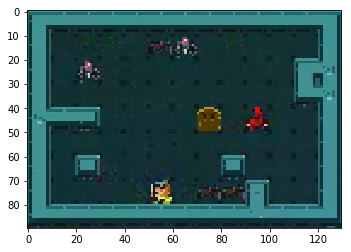

3
0.0
False


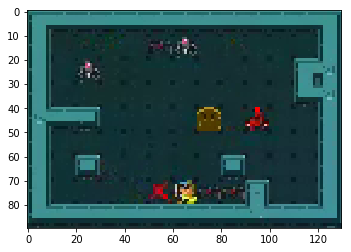

5
0.0
False


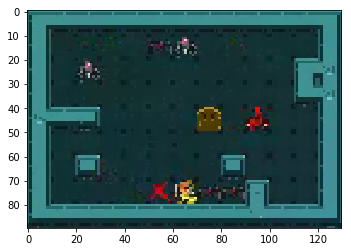

5
0.0
False


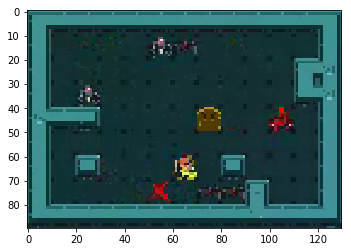

5
0.0
False


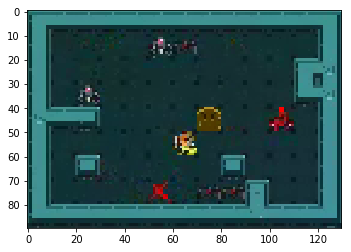

5
0.0
False


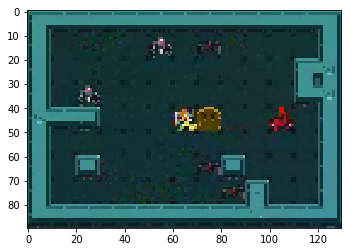

3
0.0
False


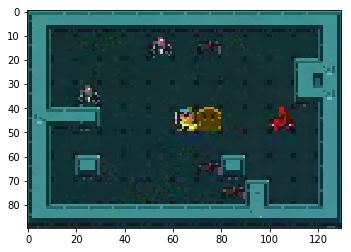

3
1.0
True
10


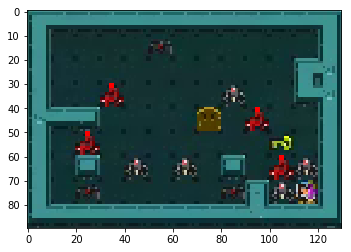

2
0.0
False


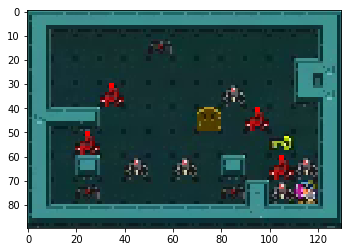

5
0.0
False


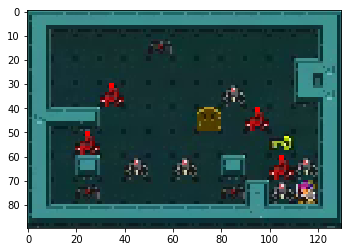

1
2.0
False


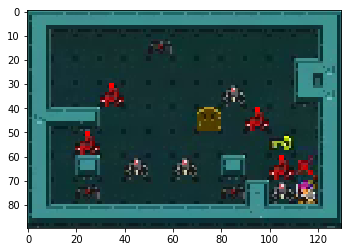

5
0.0
False


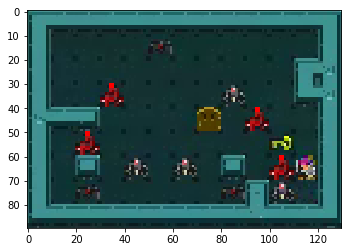

5
0.0
False


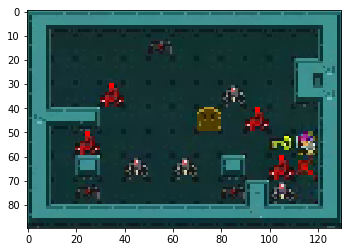

1
0.0
False


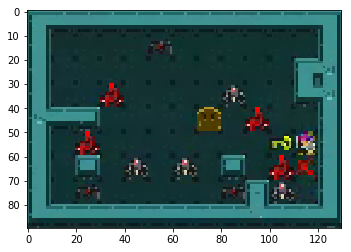

5
0.0
False


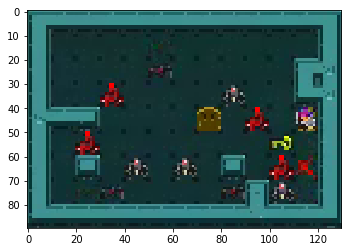

4
0.0
False


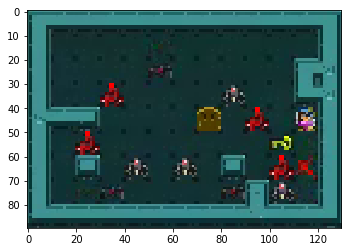

2
0.0
False


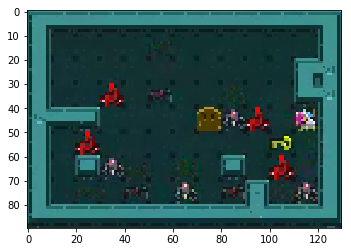

2
0.0
False


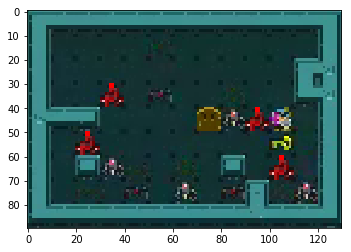

1
2.0
False


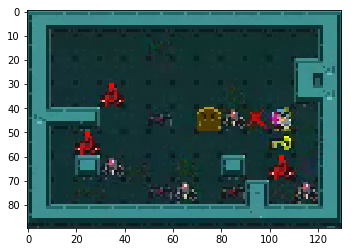

3
0.0
False


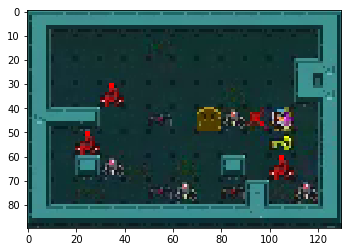

3
0.0
False


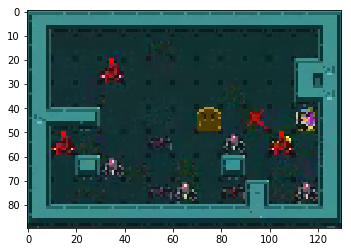

5
0.0
False


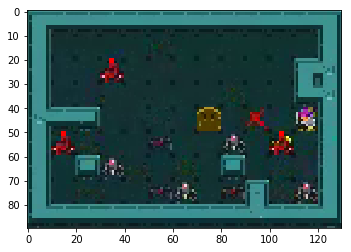

1
0.0
False


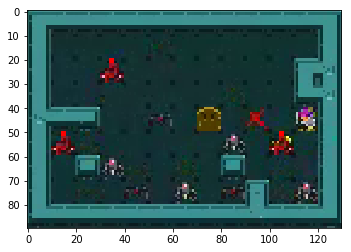

2
0.0
False


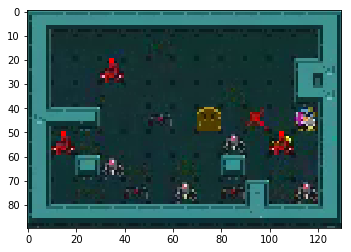

2
0.0
False


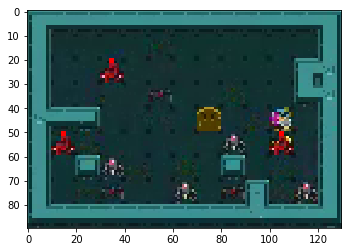

2
0.0
False


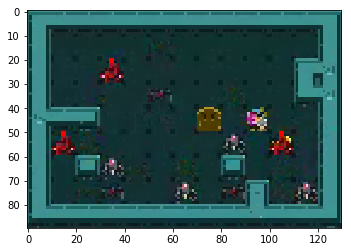

5
0.0
False


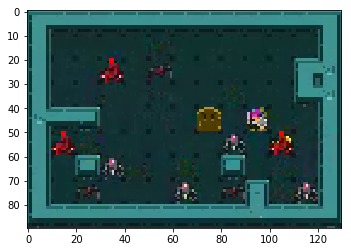

5
0.0
False


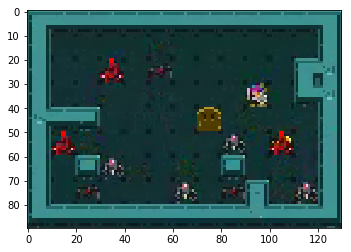

2
0.0
False


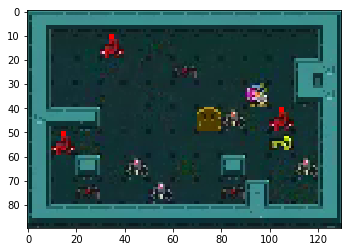

1
0.0
False


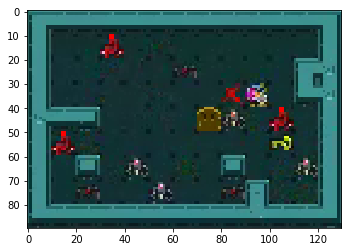

1
0.0
False


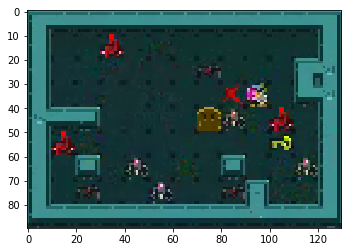

2
0.0
False


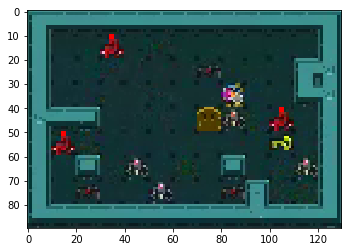

2
2.0
False


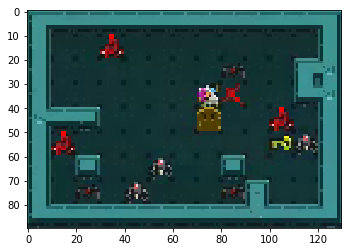

1
0.0
False


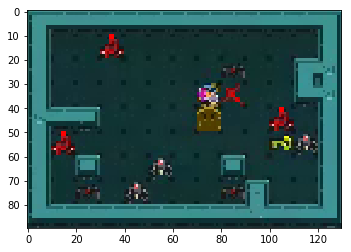

2
0.0
False


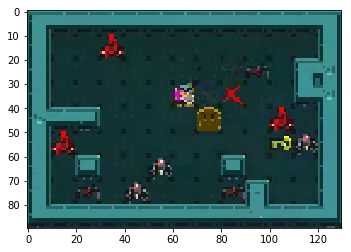

4
0.0
False


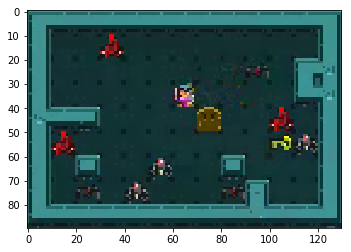

4
0.0
False


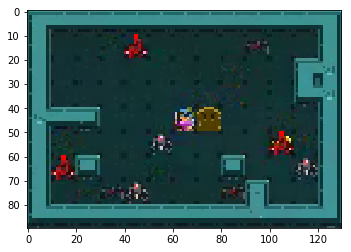

3
0.0
False


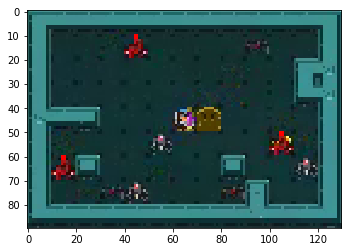

3
0.0
False


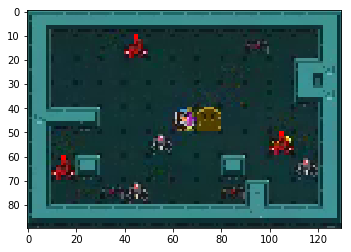

2
0.0
False


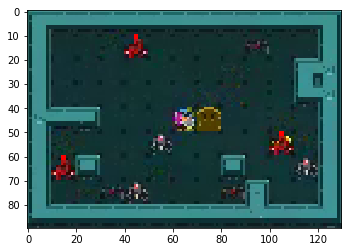

1
2.0
False


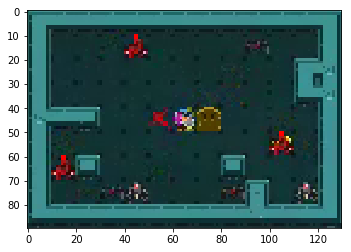

2
0.0
False


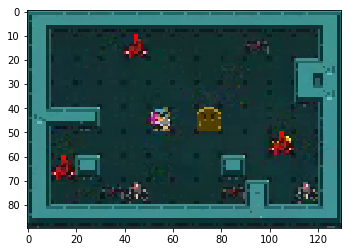

5
0.0
False


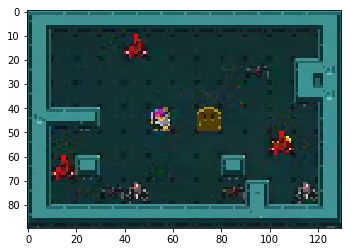

5
0.0
False


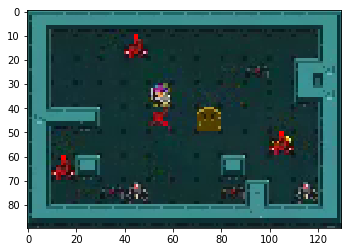

5
0.0
False


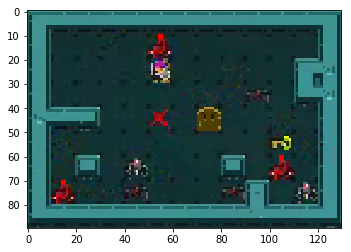

4
0.0
False


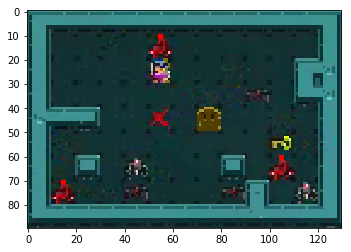

4
0.0
False


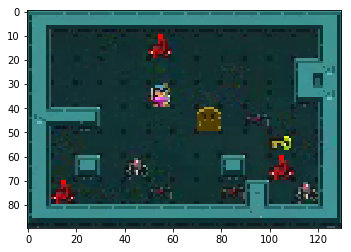

4
0.0
False


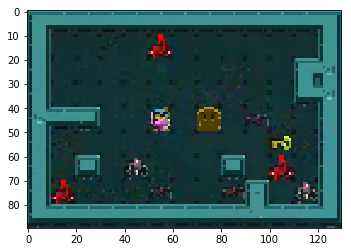

4
0.0
False


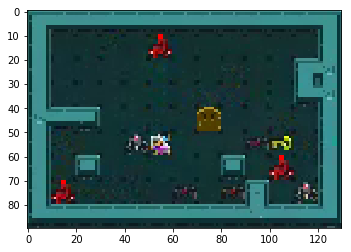

4
0.0
False


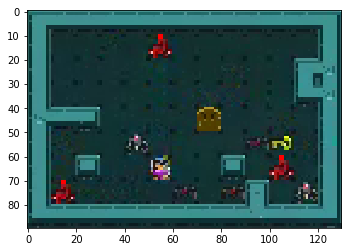

4
0.0
False


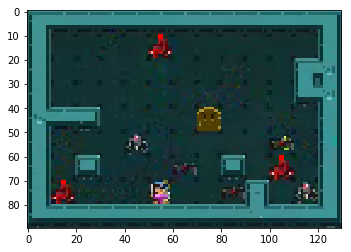

5
0.0
False


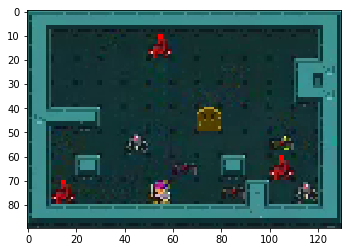

4
0.0
False


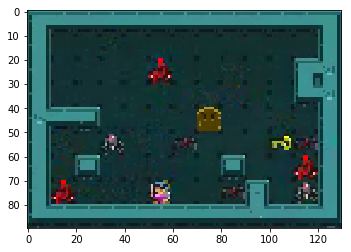

2
0.0
False


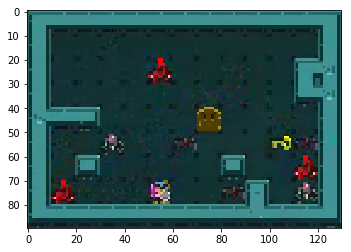

2
0.0
False


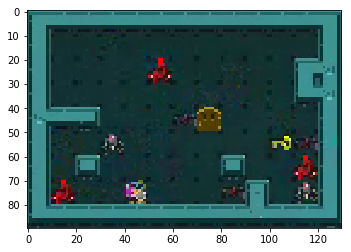

2
0.0
False


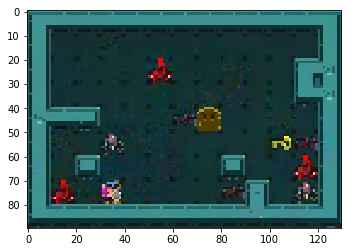

5
0.0
False


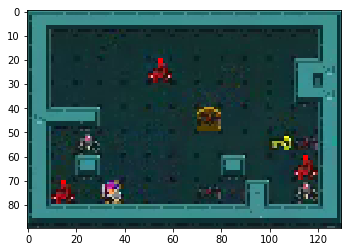

5
0.0
False


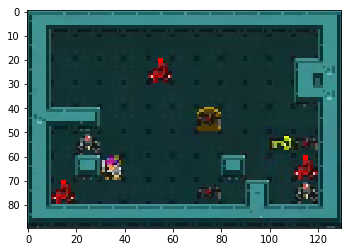

5
0.0
False


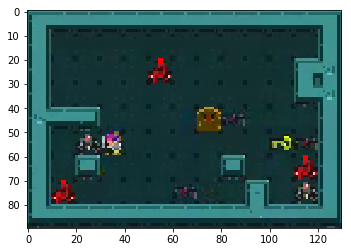

5
0.0
False


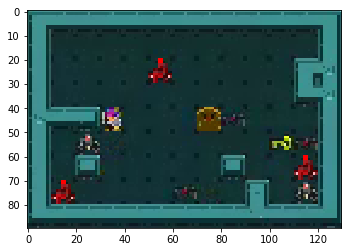

3
0.0
False


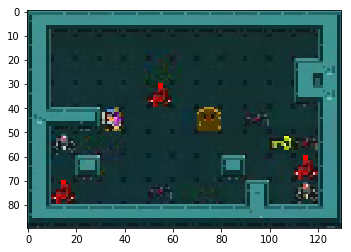

3
0.0
False


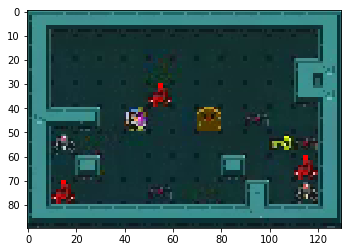

3
0.0
False


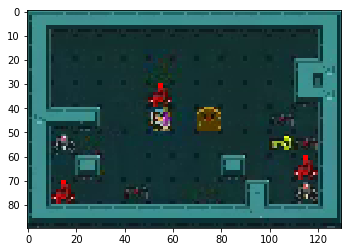

3
0.0
False


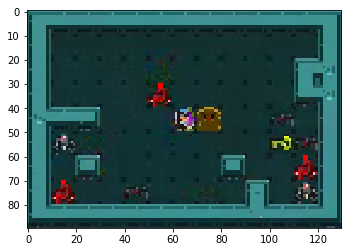

3
0.0
False


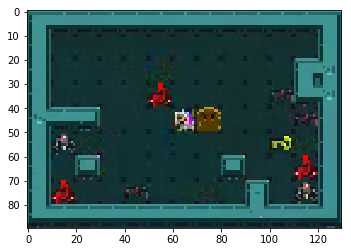

2
0.0
False


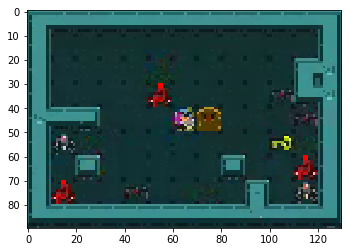

5
0.0
False


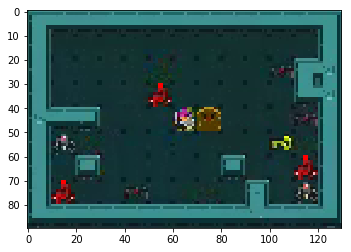

5
0.0
False


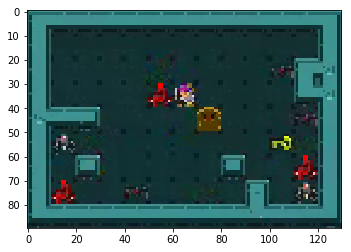

2
0.0
False


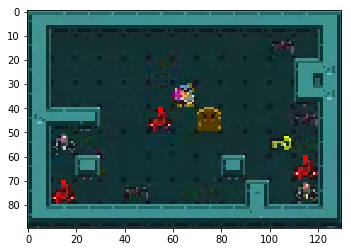

4
0.0
False


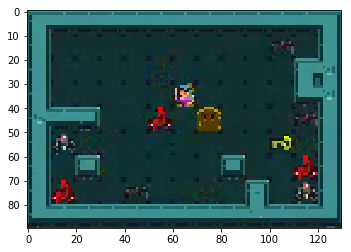

4
0.0
False


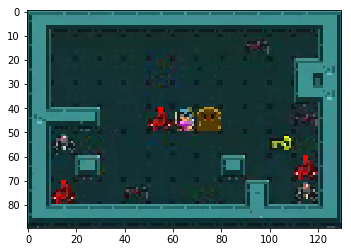

4
0.0
False


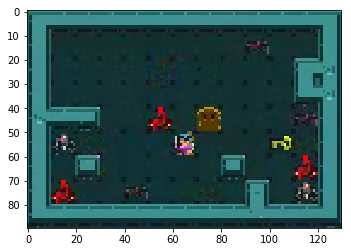

2
0.0
False


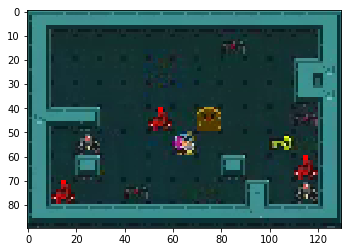

4
0.0
False


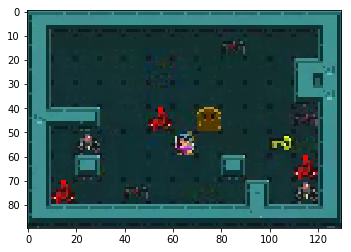

4
0.0
False


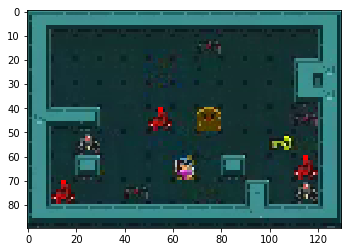

5
0.0
False


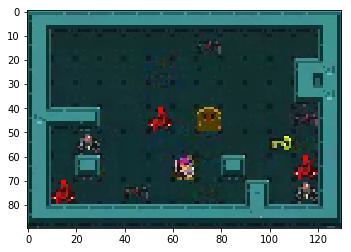

3
0.0
False


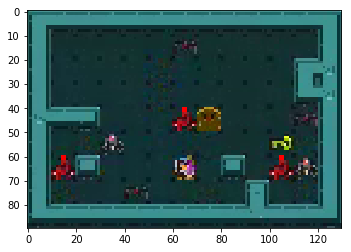

5
0.0
False


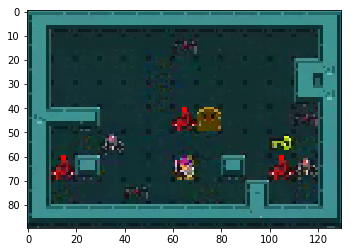

5
0.0
False


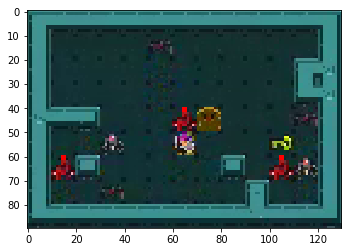

1
2.0
False


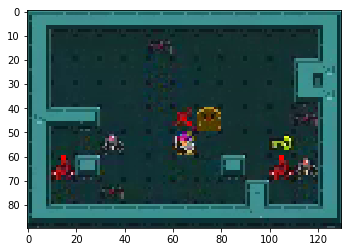

5
0.0
False


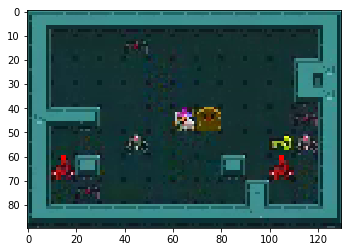

1
0.0
False


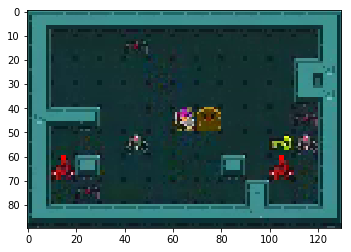

5
0.0
False


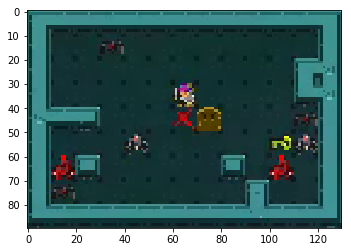

5
0.0
False


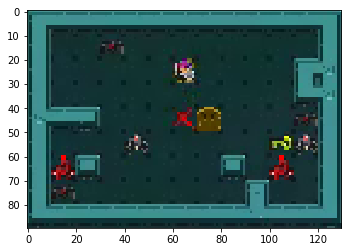

4
0.0
False


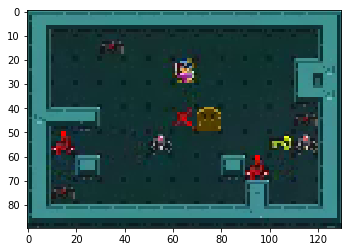

4
0.0
False


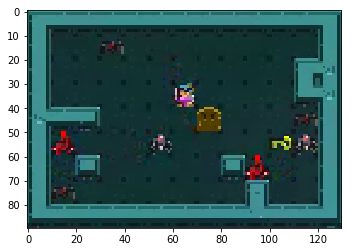

2
0.0
False


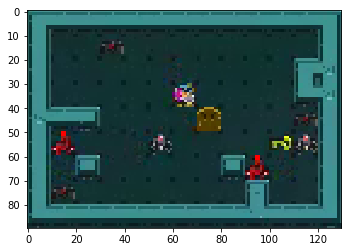

2
0.0
False


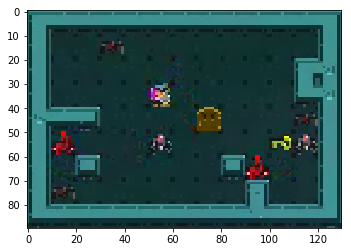

2
0.0
False


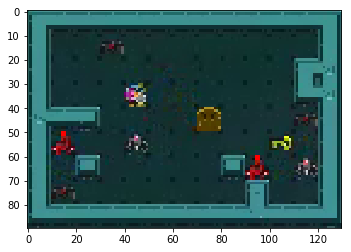

5
0.0
False


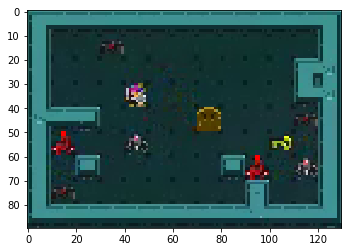

3
0.0
False


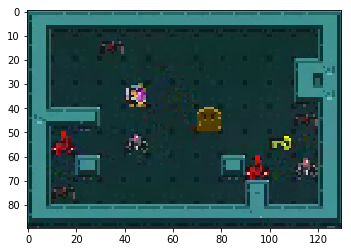

3
0.0
False


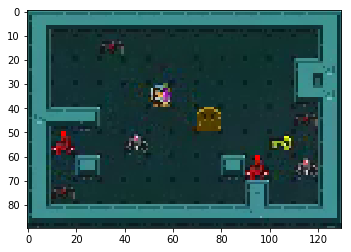

4
0.0
False


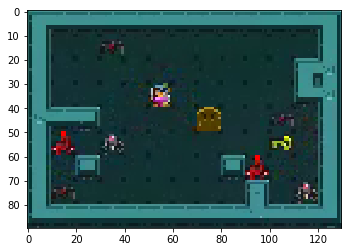

4
0.0
False


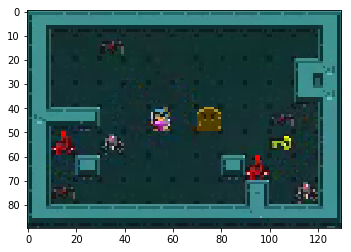

4
0.0
False


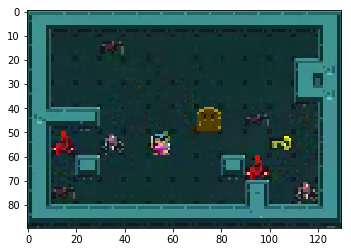

1
0.0
False


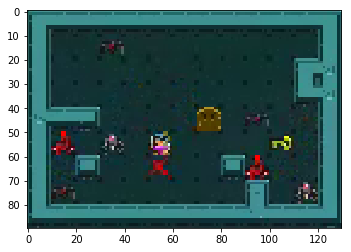

4
0.0
False


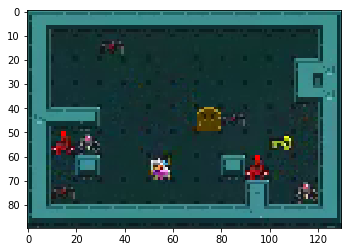

4
0.0
False


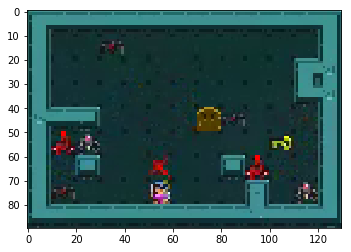

2
0.0
False


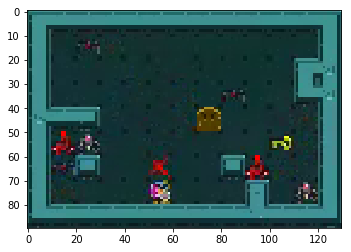

3
0.0
False


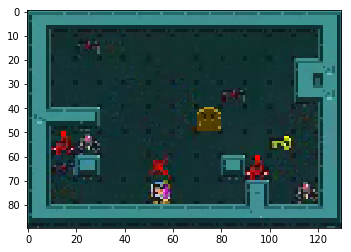

3
0.0
False


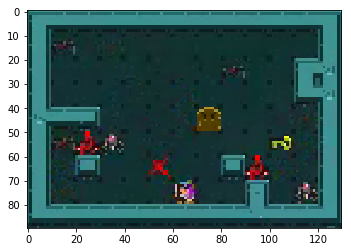

1
0.0
False


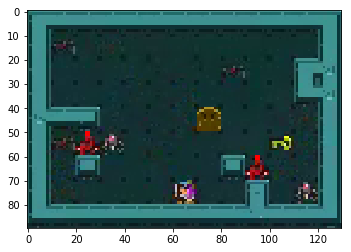

1
0.0
False


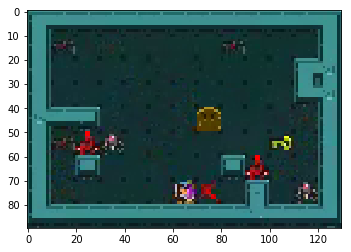

4
0.0
False


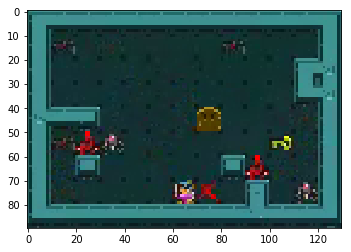

1
0.0
False


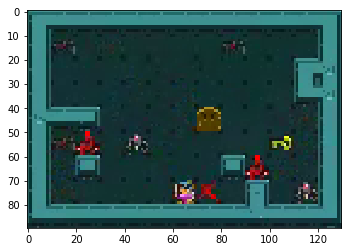

5
0.0
False


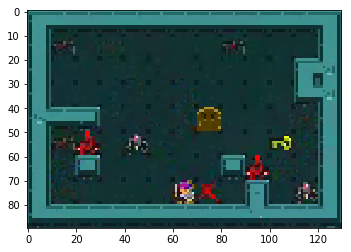

5
0.0
False


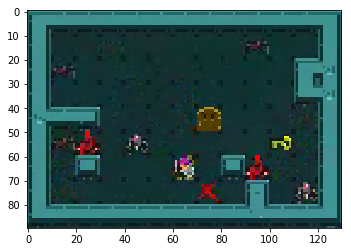

1
0.0
False


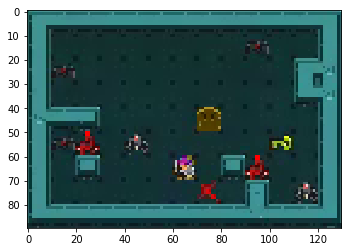

1
0.0
False


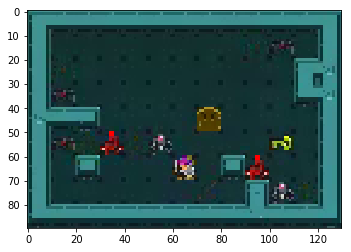

5
0.0
False


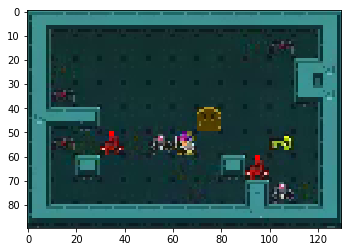

5
0.0
False


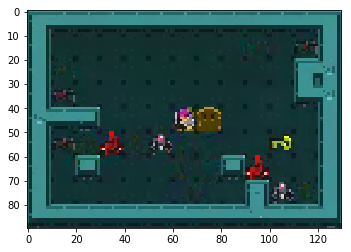

4
0.0
False


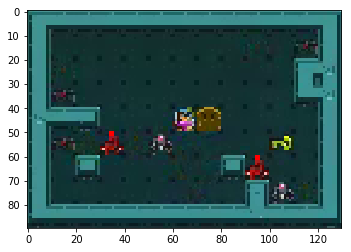

2
0.0
False


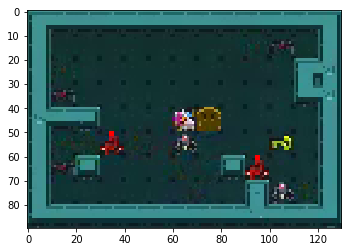

5
0.0
False


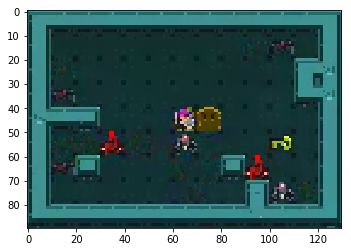

5
0.0
False


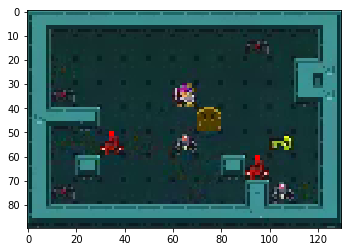

5
0.0
False


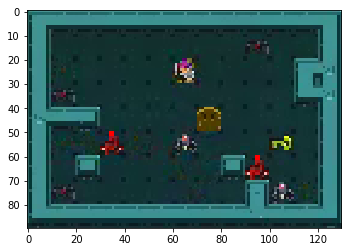

5
0.0
False


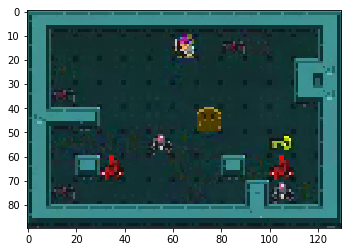

2
0.0
False


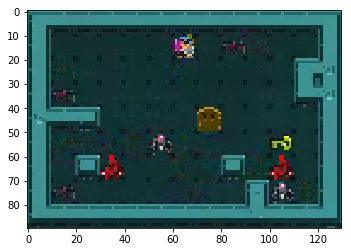

3
0.0
False


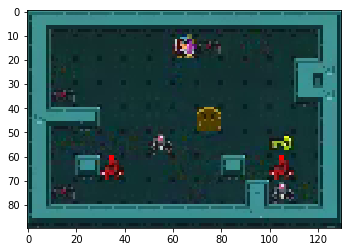

4
0.0
False


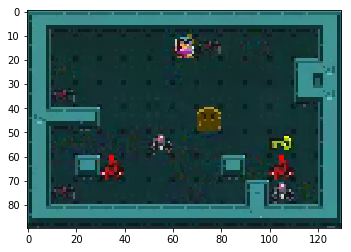

4
0.0
False


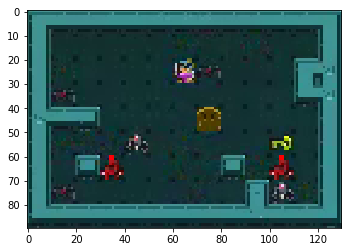

4
0.0
False


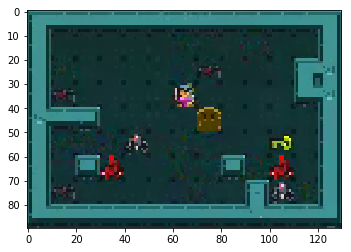

4
0.0
False


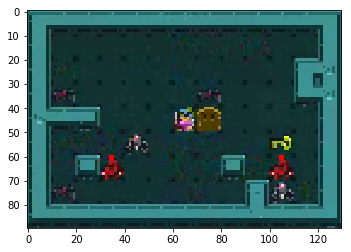

2
0.0
False


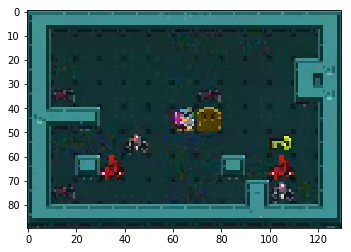

4
0.0
False


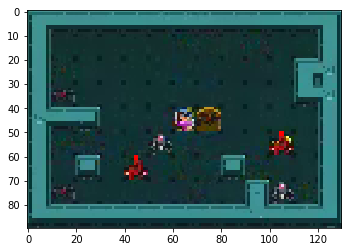

1
0.0
False


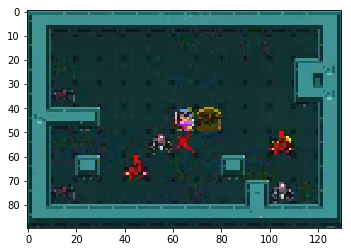

4
0.0
False


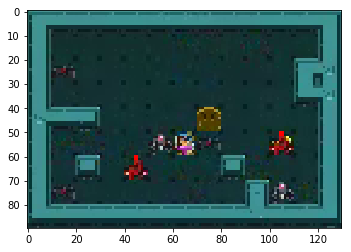

4
0.0
False


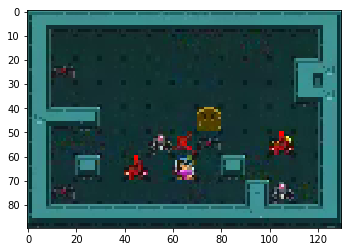

3
2.0
False


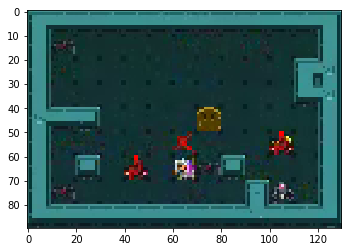

4
0.0
False


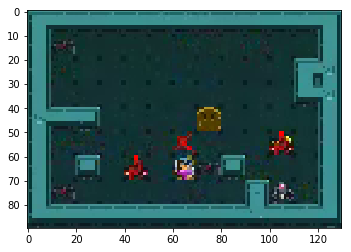

5
0.0
False


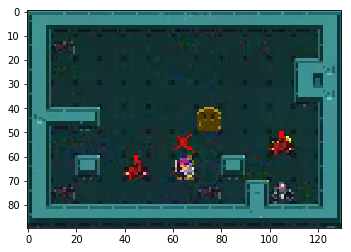

5
0.0
False


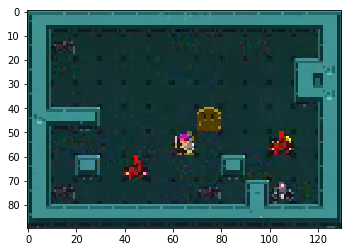

2
0.0
False


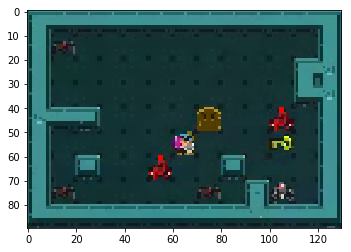

1
0.0
False


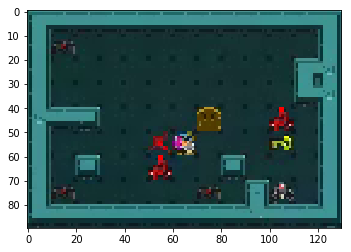

2
0.0
False


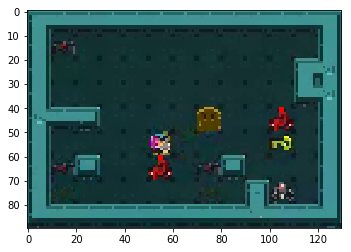

2
0.0
False


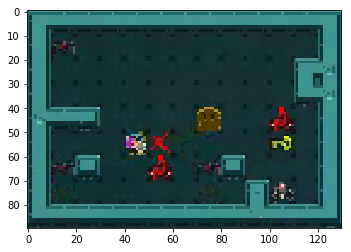

5
0.0
False


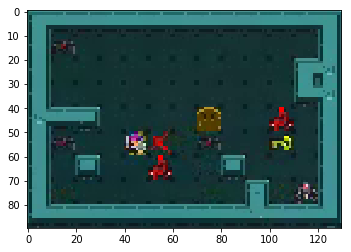

5
0.0
False


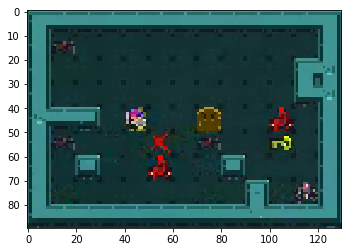

5
0.0
False


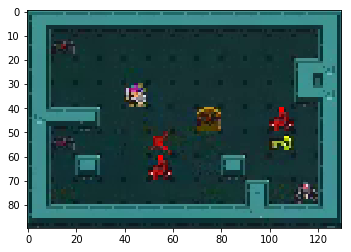

4
0.0
False


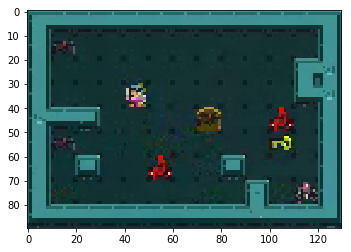

2
0.0
False


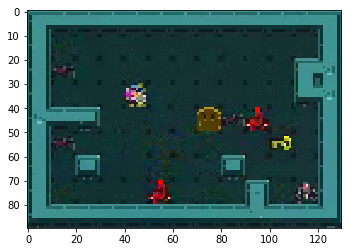

2
0.0
False


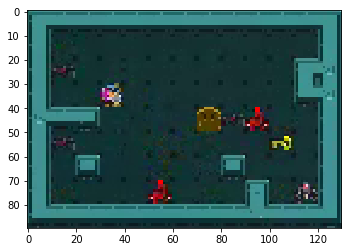

2
0.0
False


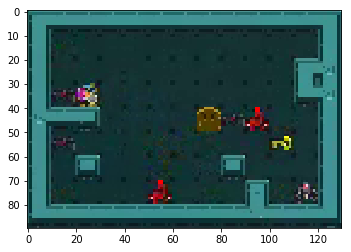

5
0.0
False


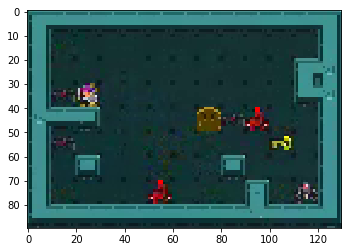

1
0.0
False


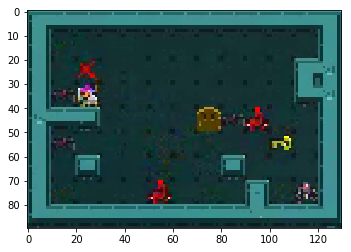

2
0.0
False


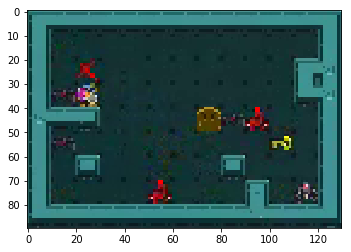

3
0.0
False


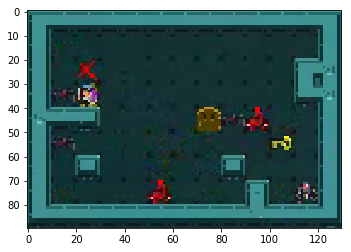

3
0.0
False


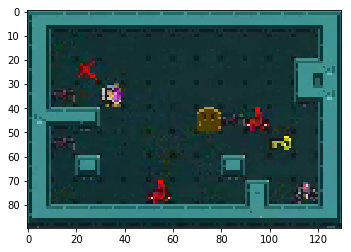

3
0.0
False


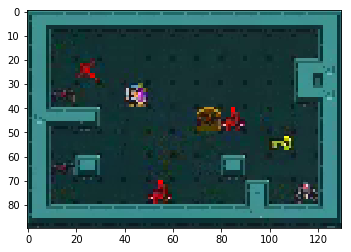

3
0.0
False


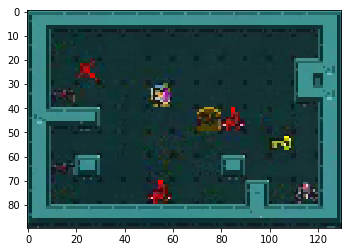

3
0.0
False


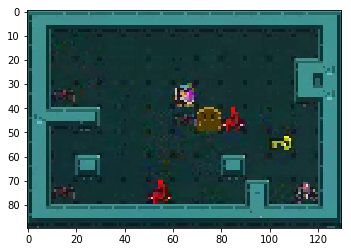

1
0.0
False


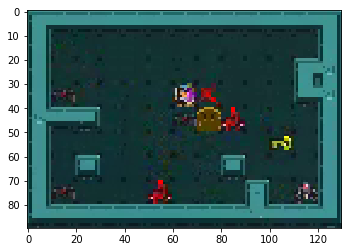

3
0.0
False


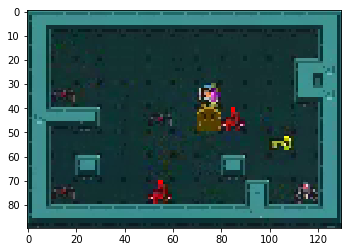

2
0.0
False


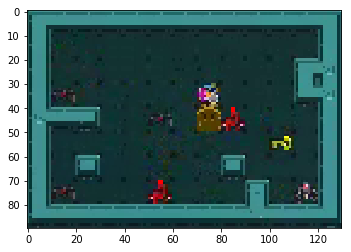

3
0.0
False


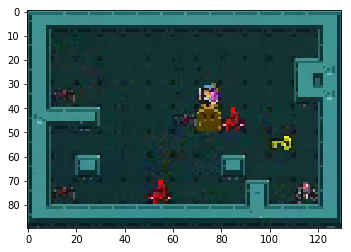

3
0.0
False


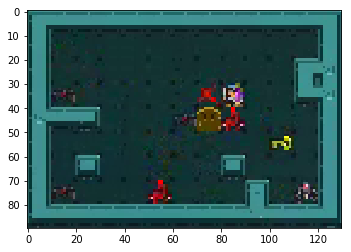

1
0.0
False


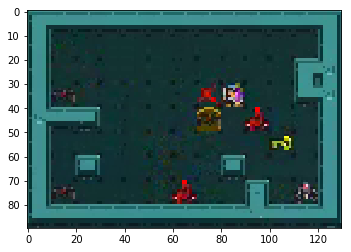

3
0.0
False


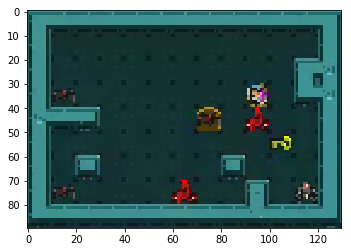

3
0.0
False


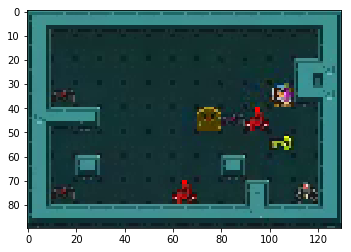

3
0.0
False


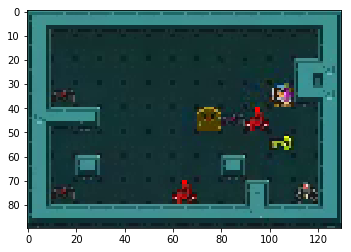

5
0.0
False


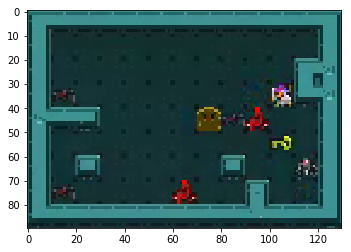

1
0.0
False


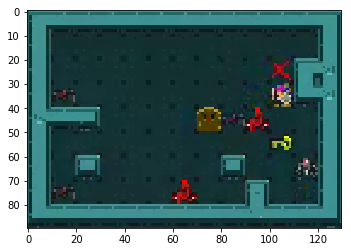

5
0.0
False


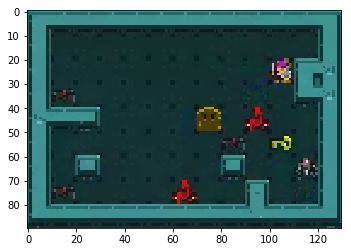

4
0.0
False


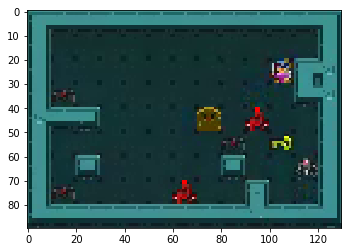

2
0.0
False


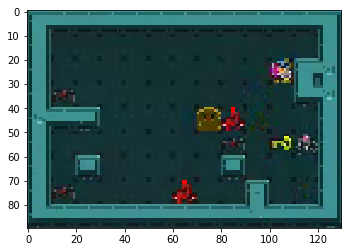

2
0.0
False


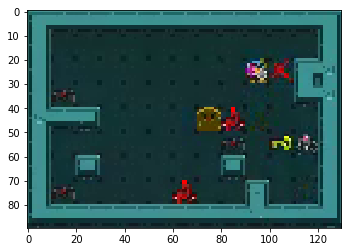

2
0.0
False


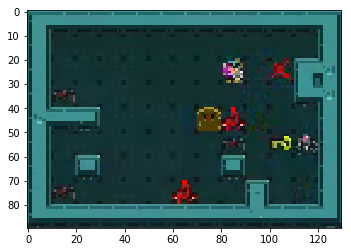

1
0.0
False


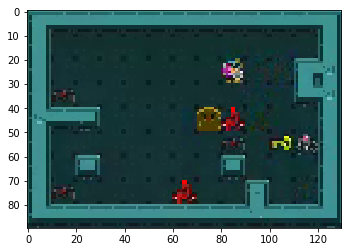

2
0.0
False


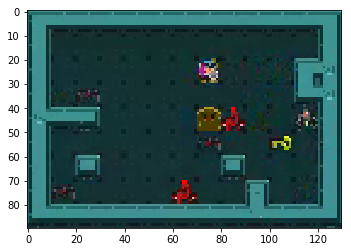

2
0.0
False


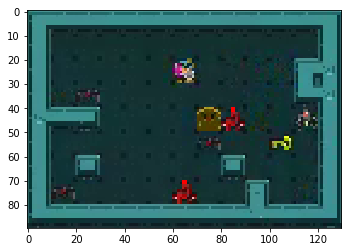

2
0.0
False


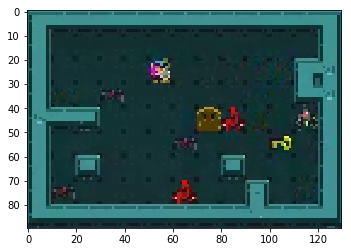

2
0.0
False


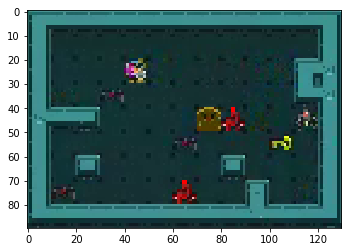

1
0.0
False


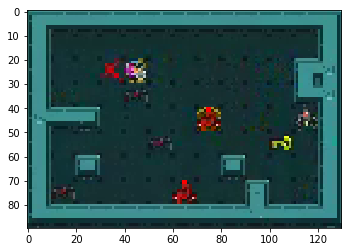

3
0.0
False


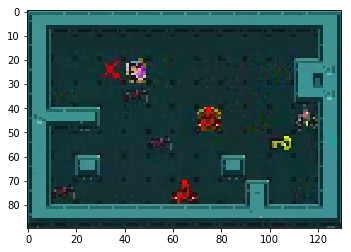

3
0.0
False


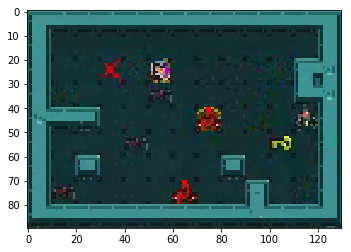

3
0.0
False


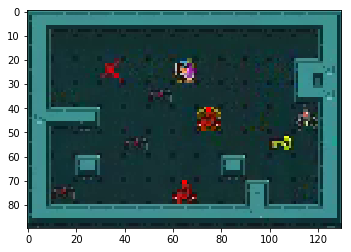

3
0.0
False


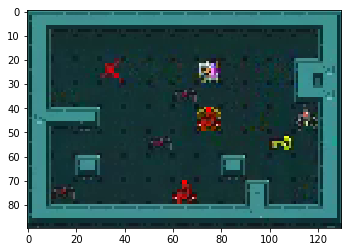

3
0.0
False


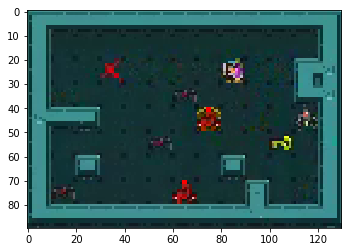

3
0.0
False


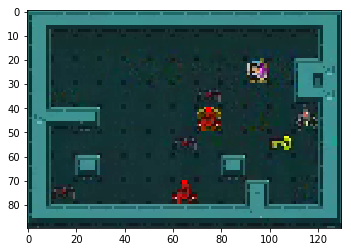

3
0.0
False


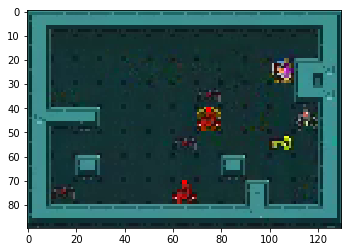

1
0.0
False


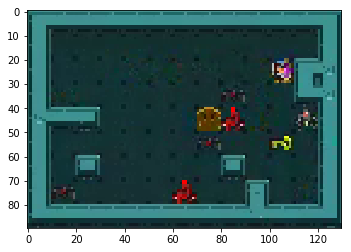

4
0.0
False


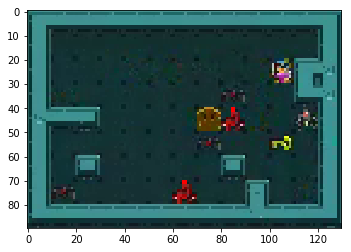

1
0.0
False


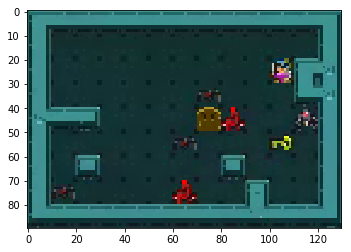

4
0.0
False


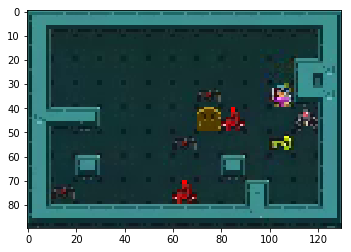

4
0.0
False


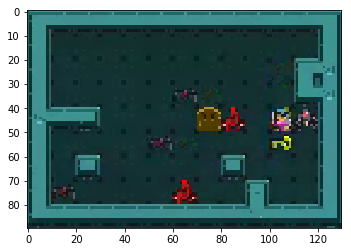

4
1.0
False


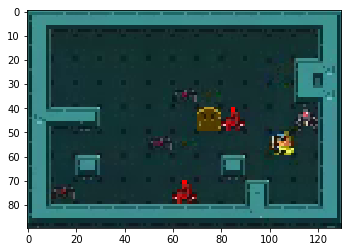

2
0.0
False


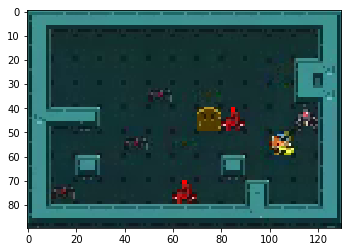

1
0.0
False


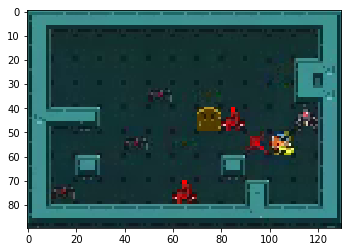

2
0.0
False


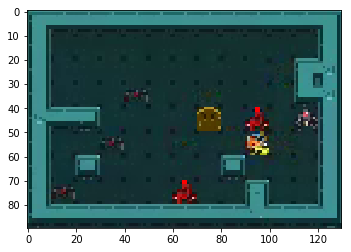

2
0.0
False


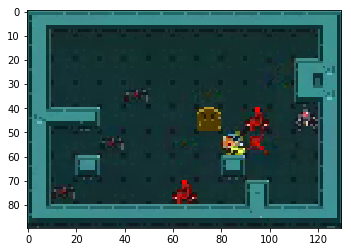

5
0.0
False


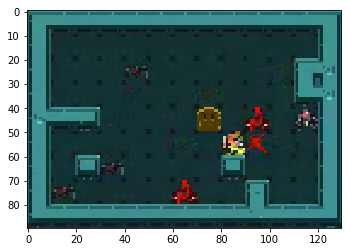

5
0.0
False


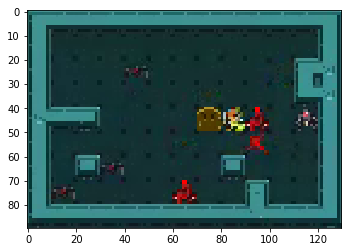

2
0.0
False


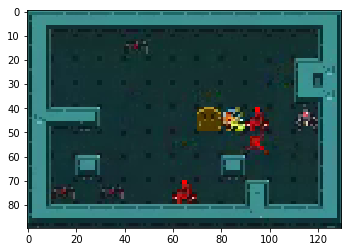

2
1.0
True
11
actions (509, 1)
obs (509,)
rewards (509,)
episode_returns (11,)
episode_starts (509,)


{'actions': array([[5],
        [1],
        [5],
        [5],
        [2],
        [2],
        [1],
        [4],
        [1],
        [2],
        [2],
        [2],
        [2],
        [5],
        [5],
        [5],
        [1],
        [5],
        [5],
        [2],
        [2],
        [5],
        [4],
        [1],
        [4],
        [2],
        [2],
        [1],
        [5],
        [5],
        [5],
        [2],
        [2],
        [2],
        [5],
        [1],
        [3],
        [1],
        [3],
        [5],
        [5],
        [5],
        [2],
        [2],
        [2],
        [2],
        [2],
        [5],
        [1],
        [5],
        [4],
        [3],
        [2],
        [2],
        [5],
        [1],
        [5],
        [5],
        [2],
        [2],
        [5],
        [4],
        [1],
        [5],
        [2],
        [5],
        [2],
        [5],
        [2],
        [1],
        [2],
        [2],
        [2],
        [5],
        [5],
        [2],
 

In [106]:
generate_expert_traj(save_path="expert_zelda",n_episodes=11)

In [101]:
len(list(range(1,12)))

11